# <h1 align='center'> <font color='blue'><font size=6>Walmart - Business CaseStudy [CLT and Confidence Interval]</font> </font></h1>
<kbd>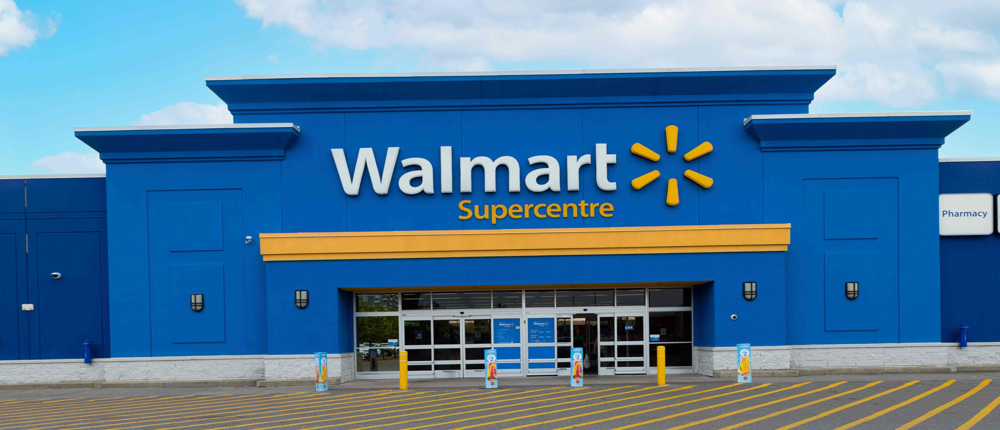</kbd>

<h2 align='center'><font color='gold'>Analysed by :</font> <u><font color='darkblue'><b> KASI</b></font></u></h2>

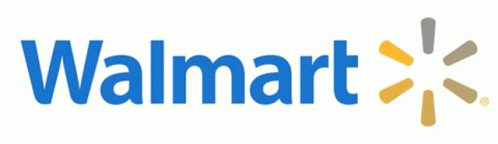


# 🧺<u>WALMART</u> :

`Walmart`, founded in `1962 by Sam Walton`, is a retail giant and one of the world's largest and most influential companies. Headquartered in `Bentonville, Arkansas`, this American multinational corporation has established itself as a global powerhouse in the retail industry. Walmart operates a vast network of hypermarkets, discount department stores, and grocery stores under various brand names across the United States and in numerous countries around the world.

Known for its `"Everyday Low Prices"` strategy, Walmart has redefined the retail landscape with its commitment to offering a wide range of products at affordable prices. With its extensive supply chain and efficient distribution systems, the company has played a pivotal role in shaping consumer expectations and shopping habits. Beyond retail, Walmart has also ventured into e-commerce, technology innovation, and sustainability initiatives, further solidifying its position as a key player in the modern retail ecosystem.

* Walmart: Where Shopping Becomes a Global Phenomenon

`Walmart`, the retail titan, stretches its tentacles across 19 countries, boasting over 10,500 stores and serving more than 100 million customers worldwide. It's not just a shopping haven; it's a data goldmine waiting to be unearthed.


* A Retail Colossus with a Human Touch

Despite its vast size, Walmart remains dedicated to its core values of customer service and community involvement. The company's philanthropic efforts focus on areas like hunger relief and children's health, and its commitment to employee development has earned it recognition as a top employer.

Walmart's story is far from over. As the retail landscape continues to evolve, this retail giant is sure to adapt and innovate, remaining a dominant force in the world of shopping.


## <u>Business Problem</u>:
### 🏷️ Objective

* The Management team at Walmart Inc. wants to analyze the customer purchase behavior (specifically, purchase amount) against the customer’s gender and the various other factors to help the business make better decisions.
* They want to understand if the spending habits differ between male and female customers: Do women spend more on Black Friday than men? (Assume 50 million customers are male and 50 million are female).

#### 👀 About Data

The company collected the transactional data of customers who purchased products from the Walmart Stores during Black Friday.

#### 📃 Features of the dataset:
The dataset has the following features:

| Feature | Description |
|:--------|:------------|
|User_ID|	User ID|
|Product_ID|Product ID|
|Gender|	Sex of User|
|Age	|Age in bins|
|Occupation|	Occupation(Masked)|
|City_Category|	Category of the City (A,B,C)|
|StayInCurrentCityYears|	Number of years stay in current city|
|Marital_Status|	Marital Status|
|ProductCategory|	Product Category (Masked)|
|Purchase|	Purchase Amount|

-----

In [284]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm,boxcox
from statsmodels.stats.weightstats import ztest
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
# walmart colour palette
cp = ['#003087','#007dc6','#79b9e7','#ffb81c','#ffc120','#f47421','#6cace4','#76c143','#222222','#444444']
cp1 = ['#0071ce','#ffc220','#003087','#ffb81c','#6cace4']
cp2 = ['#0071CE','#FCB61A']
cp3 = ['#0071CE','#ffc220','#003087','#ffc120','#ffb81c','#f47421','#6cace4','#76c143','#222222','#444444','#79b9e7','#ffb81c']

In [3]:
walmart = pd.read_csv('walmart_data.csv')

In [4]:
wm = walmart.copy()

### **Exploration of data :**

In [4]:
wm.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,7969


In [5]:
wm.tail(3)

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
550065,1006036,P00375436,F,26-35,15,B,4+,1,20,137
550066,1006038,P00375436,F,55+,1,C,2,0,20,365
550067,1006039,P00371644,F,46-50,0,B,4+,1,20,490


In [6]:
wm.shape

(550068, 10)

----
### **🕎 Changing the Datatype of Columns**

In [7]:
wm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   User_ID                     550068 non-null  int64 
 1   Product_ID                  550068 non-null  object
 2   Gender                      550068 non-null  object
 3   Age                         550068 non-null  object
 4   Occupation                  550068 non-null  int64 
 5   City_Category               550068 non-null  object
 6   Stay_In_Current_City_Years  550068 non-null  object
 7   Marital_Status              550068 non-null  int64 
 8   Product_Category            550068 non-null  int64 
 9   Purchase                    550068 non-null  int64 
dtypes: int64(5), object(5)
memory usage: 42.0+ MB


In [5]:
for _ in wm.columns[:-1]:
    wm[_] = wm[_].astype('category')
wm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype   
---  ------                      --------------   -----   
 0   User_ID                     550068 non-null  category
 1   Product_ID                  550068 non-null  category
 2   Gender                      550068 non-null  category
 3   Age                         550068 non-null  category
 4   Occupation                  550068 non-null  category
 5   City_Category               550068 non-null  category
 6   Stay_In_Current_City_Years  550068 non-null  category
 7   Marital_Status              550068 non-null  category
 8   Product_Category            550068 non-null  category
 9   Purchase                    550068 non-null  int64   
dtypes: category(9), int64(1)
memory usage: 10.3 MB


#### 🏷️ Insights

- Except Purchase Column, all the other data types are of categorical type. We have changed the datatypes of all such columns to category.

----
**📝 Statistical Summary**

In [9]:
wm.describe()

,Purchase
count,550068.000000
mean,9263.968713
std,5023.065394
min,12.000000
25%,5823.000000
50%,8047.000000
75%,12054.000000
max,23961.000000


In [10]:
wm.describe(include = 'category').T

,count,unique,top,freq
User_ID,550068,5891,1001680,1026
Product_ID,550068,3631,P00265242,1880
Gender,550068,2,M,414259
Age,550068,7,26-35,219587
Occupation,550068,21,4,72308
City_Category,550068,3,B,231173
Stay_In_Current_City_Years,550068,5,1,193821
Marital_Status,550068,2,0,324731
Product_Category,550068,20,5,150933


#### 🏷️ Insights

- `The purchase amounts` vary widely, with the minimum recorded purchase being `$12` and the maximum reaching `$23961`. The `median` purchase amount of `$8047` is notably lower than the `mean` purchase amount of `$9264`, indicating a **Right-Skewed Distribution** where a few high-value purchases pull up the mean value.



     - **User_ID** - Among *5,50,068* transactions there are `5891` unique user_id, indicating same customers buying multiple products.

     - **Product_ID** - There are `3631` unique products,with the product having the code `P00265242` being the `highest seller`, with a maximum of `1,880 units` sold.

    - **Gender** - Out of *5,50,068* transactions, *4,14,259* `(nearly 75%)` were done by **Male** gender indicating a significant disparity in purchase behavior between males and females during the Black Friday event.

    - **Age** - We have `7` unique age groups in the dataset. `26 - 35` Age group has maximum of *2,19,587* transactions. We will analyse this feature in detail in future

    - **Stay_In_Current_City_Years** - Customers with `1` year of stay in current city accounted to maximum of `1,93,821` transactions among all the other customers with (0,2,3,4+) years of stay in current city

    - **Marital_Status** - `59%` of the total transactions were done by `Unmarried Customers` and `41%` by `Married Customers`.

----

### 📜📜**Duplicate Detection**

In [11]:
wm.duplicated().sum()

0

### 🏷️ Insights

- The dataset does not contain any duplicates.
-----
### 🔸❓**Null Detection**

In [12]:
wm.isna().any()

User_ID                       False
Product_ID                    False
Gender                        False
Age                           False
Occupation                    False
City_Category                 False
Stay_In_Current_City_Years    False
Marital_Status                False
Product_Category              False
Purchase                      False
dtype: bool

In [13]:
wm.isnull().sum()

User_ID                       0
Product_ID                    0
Gender                        0
Age                           0
Occupation                    0
City_Category                 0
Stay_In_Current_City_Years    0
Marital_Status                0
Product_Category              0
Purchase                      0
dtype: int64

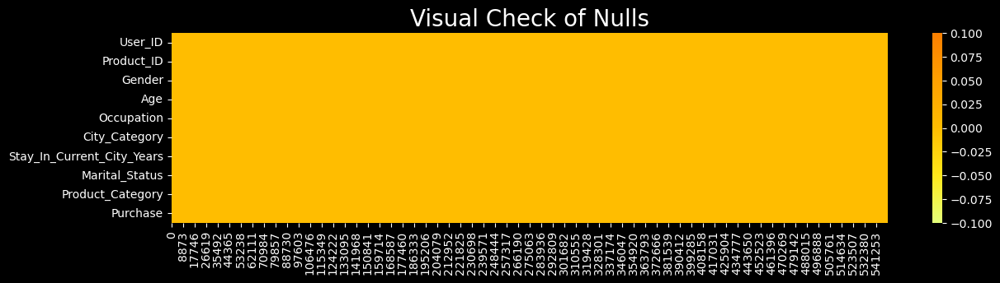

In [32]:
plt.figure(figsize=(14,3))
plt.style.use('dark_background')
sns.heatmap(wm.isnull().T,cmap='Wistia')
plt.title('Visual Check of Nulls',fontsize=20)
plt.show()

### 🏷️ Insights

- The dataset does not contain any missing values.

-----

## 🕵️‍♂️**Exploratory Data Analysis**

### 🔰**Non-Graphical Analysis** 

In [15]:
#checking the unique values for columns
for col in wm.columns:
    print()
    print('Total Unique Values in',col,'column are :-',wm[col].nunique())
    print('Unique Values in',col,'column are :-\n',wm[col].unique())
    print()
    print('-'*140)


Total Unique Values in User_ID column are :- 5891
Unique Values in User_ID column are :-
 [1000001, 1000002, 1000003, 1000004, 1000005, ..., 1004588, 1004871, 1004113, 1005391, 1001529]
Length: 5891
Categories (5891, int64): [1000001, 1000002, 1000003, 1000004, ..., 1006037, 1006038, 1006039, 1006040]

--------------------------------------------------------------------------------------------------------------------------------------------

Total Unique Values in Product_ID column are :- 3631
Unique Values in Product_ID column are :-
 ['P00069042', 'P00248942', 'P00087842', 'P00085442', 'P00285442', ..., 'P00375436', 'P00372445', 'P00370293', 'P00371644', 'P00370853']
Length: 3631
Categories (3631, object): ['P00000142', 'P00000242', 'P00000342', 'P00000442', ..., 'P0099642', 'P0099742', 'P0099842', 'P0099942']

--------------------------------------------------------------------------------------------------------------------------------------------

Total Unique Values in Gender co

In [16]:
for _ in wm.columns:
    if wm[_].dtype != 'category':
        print(f'Value_counts of the column {_} are :- \n{wm[_].value_counts().to_frame().reset_index()}')
        print()
        print('-'*140)
        print()

Value_counts of the column Purchase are :- 
       Purchase  count
0          7011    191
1          7193    188
2          6855    187
3          6891    184
4          7012    183
...         ...    ...
18100     23491      1
18101     18345      1
18102      3372      1
18103       855      1
18104     21489      1

[18105 rows x 2 columns]

--------------------------------------------------------------------------------------------------------------------------------------------



In [6]:
#replacing the values in marital_status column

wm['Marital_Status'] = wm['Marital_Status'].replace({0:'Single',1:'Married'})
wm['Marital_Status'].unique()

['Single', 'Married']
Categories (2, object): ['Single', 'Married']

In [18]:
wm.sample(2)

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
303394,1004705,P00051842,F,18-25,0,C,0,Married,4,2761
253603,1003155,P00024342,M,26-35,7,A,1,Single,8,9965


In [19]:
wm.Product_ID.nunique() , wm.Product_Category.nunique()

(3631, 20)

In [20]:
cols = ['Gender','Age','Product_Category','City_Category','Occupation','Stay_In_Current_City_Years','Marital_Status']
for _ in cols:
    print(_,'percentage proportions')
    print('*'*(len(_)+23))
    print()
    print((wm[_].value_counts(normalize=True)*100).to_frame().reset_index().round(2))
    print()
    print("-"*140)
    print()

Gender percentage proportions
*****************************

  Gender  proportion
0      M       75.31
1      F       24.69

--------------------------------------------------------------------------------------------------------------------------------------------

Age percentage proportions
**************************

     Age  proportion
0  26-35       39.92
1  36-45       20.00
2  18-25       18.12
3  46-50        8.31
4  51-55        7.00
5    55+        3.91
6   0-17        2.75

--------------------------------------------------------------------------------------------------------------------------------------------

Product_Category percentage proportions
***************************************

   Product_Category  proportion
0                 5       27.44
1                 1       25.52
2                 8       20.71
3                11        4.42
4                 2        4.34
5                 6        3.72
6                 3        3.67
7                 4        2.1

In [21]:
wm.groupby(['Gender'])[['User_ID']].nunique()

,User_ID
Gender,
F,1666
M,4225


In [22]:
wm.groupby(['Gender'])[['User_ID','Purchase']].agg({'User_ID' : 'nunique','Purchase' : 'sum'})

,User_ID,Purchase
Gender,,
F,1666,1186232642
M,4225,3909580100


In [23]:
cat_cols = ['Gender','Age','Occupation','City_Category','Stay_In_Current_City_Years','Marital_Status', 'Product_Category']
cat_cols_melt = wm[cat_cols].melt()
cat_cols_melt

,variable,value
0,Gender,F
1,Gender,F
2,Gender,F
3,Gender,F
4,Gender,M
...,...,...
3850471,Product_Category,20
3850472,Product_Category,20
3850473,Product_Category,20
3850474,Product_Category,20


In [24]:
(cat_cols_melt.groupby(['variable','value'])[['value']].count() / len(wm['User_ID'])*100).round(2)

value
variable                   value         
Age                        0-17      2.75
                           18-25    18.12
                           26-35    39.92
                           36-45    20.00
                           46-50     8.31
                           51-55     7.00
                           55+       3.91
City_Category              A        26.85
                           B        42.03
                           C        31.12
Gender                     F        24.69
                           M        75.31
Marital_Status             Married  40.97
                           Single   59.03
Occupation                 0        12.66
                           1         8.62
                           2         4.83
                           3         3.21
                           4        13.15
                           5         2.21
                           6         3.70
                           7        10.75
                           8         0.28
                           9         1.14
                           10        2.35
                           11        2.11
                           12        5.67
                           13        1.40
                           14        4.96
                           15        2.21
                           16        4.61
                           17        7.28
                           18        1.20
                           19        1.54
                           20        6.10
Product_Category           1        25.52
                           2         4.34
                           3         3.67
                           4         2.14
                           5        27.44
                           6         3.72
                           7         0.68
                           8        20.71
                           9         0.07
                           10        0.93
                           11        4.42
                           12        0.72
                           13        1.01
                           14        0.28
                           15        1.14
                           16        1.79
                           17        0.11
                           18        0.57
                           19        0.29
                           20        0.46
Stay_In_Current_City_Years 0        13.53
                           1        35.24
                           2        18.51
                           3        17.32
                           4+       15.40

#### 🧐 Observations:

- We can see that there are `75%` of the **Male customers** in the data and `25%` of the **Female customers** have purchased.
- We can also see that the **Male customers** have `purchased more products` from Walmart than the *Female customers*.
- We can also observe that the 40% of the customers are from the Age range of `26-35`. The second highest is 20% for *36-45 Age* range.
- We can see that `40%` of the customers are from the **city category of B** and `30%` of the customers are from *category is C*.
- From the data we can see that `59%` of the customers are **single**.
- Highest product sold is of **Product Category 5** with `55.2% sales`. Second highest product sold is of Product Category 1 with 51.3%

----

In [25]:
print(f"Genderwise distribution".upper())
print()

for _ in wm.columns[:-1]:
    if _ not in ["User_ID","Purchase","Gender"]:
        print("_" * len(f"For {_}"))
        print(f"For {_} :".upper())
        print("_" * len(f"For {_}"))
        print()
        print(f"{'---> '}Total Count of Users based on {_}")
        print()
        print(pd.crosstab(index = wm["Gender"], columns = wm[_], 
                          values = wm["User_ID"], aggfunc = "count", margins = True))
        ax = sns.heatmap(wmcorr,annot=True,fmt='.3f',linewidths=.5,cmap=cp2)
        print("")
        print(f"{'---> '}Total Purchase amount per user based on {_}")
        print()
        print(pd.crosstab(index = wm["Gender"], columns = wm[_], 
                          values = wm["Purchase"], aggfunc = "sum", margins = True))
        print()
        print("")
        print(f"{'---> '}Total Purchase amount per user in percentage based on {_}")
        print()
        print((pd.crosstab(index = wm["Gender"], columns = wm[_], values = wm["Purchase"],
                           aggfunc = "sum", margins = True, normalize = True)*100).round(2))
        print("_" * 140)

GENDERWISE DISTRIBUTION

______________
FOR PRODUCT_ID :
______________

---> Total Count of Users based on Product_ID

Product_ID  P00000142  P00000242  P00000342  P00000442  P00000542  P00000642  \
Gender                                                                         
F                 347         91         69         46         50         71   
M                 805        285        175         46         99        441   
All              1152        376        244         92        149        512   

Product_ID  P00000742  P00000842  P00000942  P00001042  ...  P0099042  \
Gender                                                  ...             
F                 117         14          7         76  ...        51   
M                 124         22         48        427  ...        93   
All               241         36         55        503  ...       144   

Product_ID  P0099142  P0099242  P0099342  P0099442  P0099642  P0099742  \
Gender                                 

In [59]:
wm.columns

Index(['User_ID', 'Product_ID', 'Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category',
       'Purchase'],
      dtype='object')


Outlier detection of Purchase
..............................
Minimum: 12
Maximum: 23961

Initial Range (with outlier) : 23949
Q1: 5823.0
Q2: 8047.0
Q3: 12054.0
IQR: 6231.0
Lower bound: -3523.5
upper bound: 21400.5
Final Range (without outlier) : 24924.0

Lower Outlier Percentage is 0.0%
Upper Outlier Percentage is 0.49%
Overall Outlier Percentage is 0.49%

Outlier points towards left of boxplot : 0
Outlier points towards right of boxplot : 1027 and they are {23610, 23612, 23624, 23856, 23630, 22651, 22656, 22666, 22668, 22678, 22684, 22710, 22719, 22730, 22743, 23724, 22791, 22795, 22803, 23485, 22814, 22816, 22823, 22846, 22848, 22852, 22855, 22858, 22864, 22871, 21425, 22902, 22913, 22919, 22942, 22946, 22963, 22976, 22984, 22989, 22990, 22994, 21429, 23006, 23482, 23029, 23040, 23041, 23042, 23043, 23044, 23045, 23046, 23047, 23048, 23049, 23050, 23051, 23052, 23053, 23054, 23055, 23056, 23057, 23058, 23059, 23060, 23061, 23062, 23063, 23064, 23065, 23066, 23067, 23068, 23069, 2307

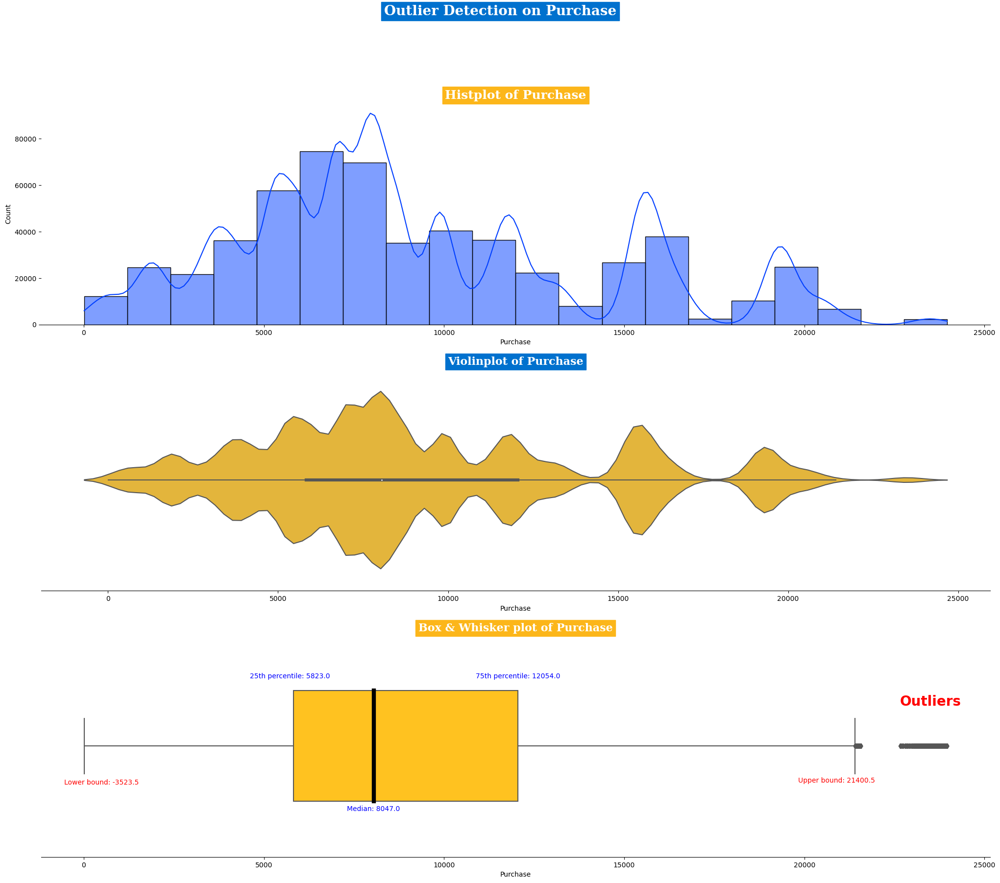

In [168]:
num_cols = ['Purchase']

for i in range(len(num_cols)):
    data = wm[num_cols[i]].tolist()
    mini = np.min(data)
    Q1 = np.percentile(data, 25)
    Q2 = np.median(data)  #percentile(data, 50)
    Q3 = np.percentile(data, 75)
    maxi = np.max(data)
    IQR = Q3 - Q1

    lo = Q1 - (1.5 * IQR)
    ho = Q3 + (1.5 * IQR)

    lower_outliers=[]
    upper_outliers=[]
    for k in data:
        if k < lo:
            lower_outliers.append(k)
            
        elif k > ho:
            upper_outliers.append(k)
            
    uo_pct = round((len(upper_outliers)*100/wm.shape[0]),2)
    lo_pct = round((len(lower_outliers)*100/wm.shape[0]),2)
    
    print()
    print(f"Outlier detection of {num_cols[i]}")
    print('.'*30)
    print("Minimum:", mini)
    print("Maximum:", maxi)
    print()
    print(f'Initial Range (with outlier) : {(maxi-mini)}')
    print("Q1:", Q1)
    print("Q2:", Q2)
    print("Q3:", Q3)
    print("IQR:", IQR)
    print("Lower bound:",lo)
    print("upper bound:",ho)
    print(f'Final Range (without outlier) : {(ho-lo)}')
    print()
    # print("Lower outliers are:", lower_outliers)
    # print("Upper outliers are:", upper_outliers)
    print(f'Lower Outlier Percentage is {lo_pct}%')
    print(f'Upper Outlier Percentage is {uo_pct}%')
    print(f'Overall Outlier Percentage is {(lo_pct+uo_pct)}%')
    print()
    
    if len(set(lower_outliers)):
        print(f'Outlier points towards left of boxplot : {len(set(lower_outliers))} and they are {(set(lower_outliers))}')
    else:
        print(f'Outlier points towards left of boxplot : {len(set(lower_outliers))}')
    if len(set(upper_outliers)):
        print(f'Outlier points towards right of boxplot : {len(set(upper_outliers))} and they are {(set(upper_outliers))}')
    else:
        print(f'Outlier points towards right of boxplot : {len(set(upper_outliers))}')
    print()
    
    plt.figure(figsize=(25,20))
    plt.style.use('default')
    plt.style.use('seaborn-v0_8-bright')
    plt.suptitle(f'Outlier Detection on {num_cols[i]}',fontfamily='serif',fontweight='bold',fontsize=20,
              backgroundcolor=cp2[i],color='w')
    print()
    plt.subplot(3,1,1)
    plt.title(f'Histplot of {num_cols[i]}',fontfamily='serif',fontweight='bold',fontsize=18,
              loc='center',backgroundcolor=cp2[i+1],color='w')
    sns.histplot(wm[num_cols[i]],bins=20,kde=True)
    
    plt.subplot(3,1,2)
    sns.violinplot(wm,x=num_cols[i],color=cp1[i+1])
    plt.title(f'Violinplot of {num_cols[i]}',fontfamily='serif',fontweight='bold',fontsize=16,
              loc='center',backgroundcolor=cp1[i],color='w')
    plt.yticks([])
    print()
    plt.subplot(3,1,3)
    bxp = sns.boxplot(wm,x=num_cols[i],color=cp1[i+1],width=0.5,saturation=97,flierprops={"marker":"d"},
                      medianprops={"color": "k", "linewidth": 6})#,boxprops={"facecolor": (.3, .5, .7, .5)})
    plt.title(f'Box & Whisker plot of {num_cols[i]}',fontfamily='serif',fontweight='bold',fontsize=16,
              loc='center',backgroundcolor=cp2[i+1],color='w')
    sns.despine(left=True)
    plt.yticks([])
    plt.text(Q2, 0.3 , f'Median: {Q2:.1f}',ha='center', va='bottom',fontsize=10,color='b')
    plt.text(Q1-100, -0.3 , f'25th percentile: {Q1:.1f}',ha='center', va='bottom',fontsize=10,color='b')
    plt.text(Q3, -0.3 , f'75th percentile: {Q3:.1f}',ha='center', va='bottom',fontsize=10,color='b')
    plt.text(500, 0.18 , f'Lower bound: {lo}',ha='center', va='bottom',fontsize=10,color='r')
    plt.text(ho-500, 0.17 , f'Upper bound: {ho}',ha='center', va='bottom',fontsize=10,color='r')
    plt.text(23500, -0.17 , 'Outliers',ha='center', va='bottom',fontsize=20,color='r',fontweight='bold')

    #bxp.annotate(f'text={Q2:.2f}',xy=(Q2,1),xytext=(Q2+1,1.5),textcoords='offset points',
    #            ha='center',fontsize=10,color='red',arrowprops= dict(arrowstyle="<-", lw=1, connectionstyle="arc,rad=0"))
# takes longer time
    # plt.subplot(4,4,1)
    # sns.swarmplot(wm,x=num_cols[i],color=cp2[i])
    # plt.title(f'Swarmplot of {num_cols[i]}',fontfamily='serif',fontweight='bold',fontsize=12,
    #           loc='center',backgroundcolor=cp2[i+1],color='w')
    # sns.despine(left=True)
    # plt.yticks([])
print('-'*144)

#### 🏷️Insights

- **Outliers**
    - There are total of `1027 outliers` which is roughly `0.49%` of the total data present in purchase amount. We will not remove them as it indicates a broad range of spending behaviors during the sale, highlighting the importance of tailoring marketing strategies to both regular and high-value customers to maximize revenue.


- **Distribution**
    - Data suggests that the majority of customers spent between `5,823 USD` and `12,054 USD`, with the `median` purchase amount being `8,047 USD`.    
    
    - The lower limit of `12 USD` while the upper limit of `21,400 USD` reveal significant variability in customer spending
    
   
----

In [548]:
wm['Purchase'].quantile(0.05)

1984.0

In [549]:
wm['Purchase'].quantile(0.95)

19336.0

In [538]:
clipped = np.clip(wm['Purchase'], wm['Purchase'].quantile(0.05), wm['Purchase'].quantile(0.95))
clipped

0          8370
1         15200
2          1984
3          1984
4          7969
          ...  
550063     1984
550064     1984
550065     1984
550066     1984
550067     1984
Name: Purchase, Length: 550068, dtype: int64

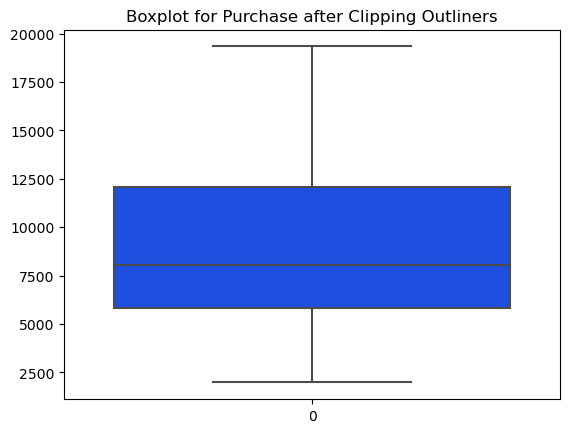

In [552]:
sns.boxplot(clipped.dropna())
plt.title('Boxplot for Purchase after Clipping Outliners')
plt.show()

In [543]:
np.percentile(wm.Purchase, 25)

5823.0

In [544]:
np.percentile(wm.Purchase, 75)

12054.0

In [553]:
clipped_data = np.clip(wm.Purchase,np.percentile(wm.Purchase,95),np.percentile(wm.Purchase, 95))
clipped_data

0         19336
1         19336
2         19336
3         19336
4         19336
          ...  
550063    19336
550064    19336
550065    19336
550066    19336
550067    19336
Name: Purchase, Length: 550068, dtype: int64

<Axes: >

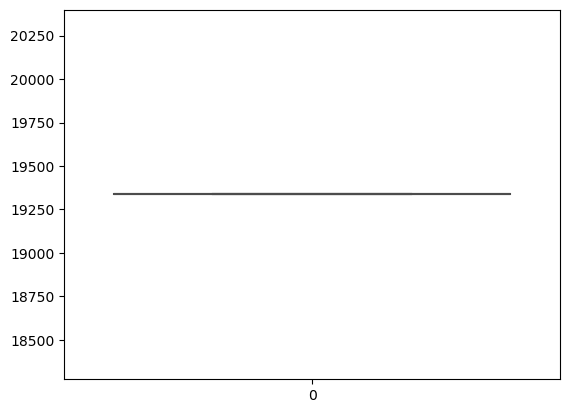

In [554]:
sns.boxplot(clipped_data)

### 📈**Graphical Analysis**
#### 📊Univariate & Bivariate

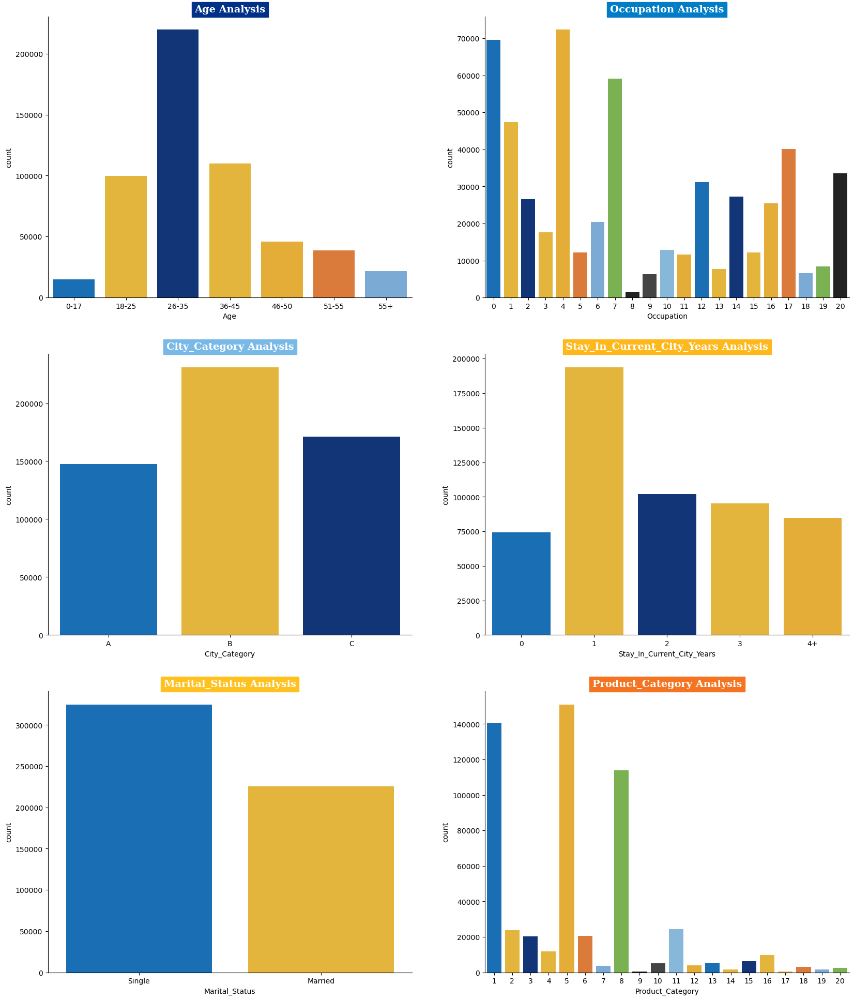

In [232]:
cat_cols = ['Age','Occupation','City_Category','Stay_In_Current_City_Years','Marital_Status', 'Product_Category']
plt.figure(figsize = (20,24))
plt.style.use('seaborn-v0_8-bright')

for i in range(len(cat_cols)):
    plt.subplot(3,2,i+1)
    sns.countplot(data = wm, x = cat_cols[i], palette = cp3)
    sns.despine()
    plt.title(f'{cat_cols[i]} Analysis',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor=cp[i],color='w')

### 🏷️ Insights

- 🧐 **Observation**

    - Customers in the age group of `26-35` have purchased **more** than other age groups.

    - Customers from `City_Category B` have purchased **more** than other city customers.
    
    - Customers who stay more than `1 year` in a **city** has the tendency to visit and purchase more.
    
    - Customers who are `Single` has purchased more than the customers who are married.

____

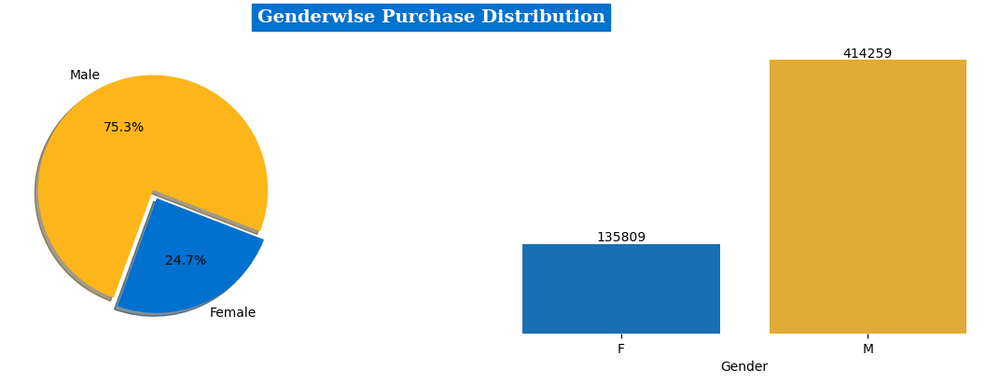

In [224]:
plt.figure(figsize=(15,4))
plt.suptitle("Genderwise Purchase Distribution",fontsize=14,fontfamily='serif',fontweight='bold'
             ,backgroundcolor=cp1[0],color='w')
plt.style.use('default')
plt.style.use('seaborn-v0_8-bright')

plt.subplot(1,2,1)
plt.pie(wm.groupby('Gender')['Gender'].count(), labels = ['Female','Male'], explode = (0.08,0),
        colors=cp2,shadow=True, startangle=250, autopct='%1.1f%%',textprops={'color':"k"})
    
plt.subplot(1,2,2)
label = sns.countplot(data = wm, x='Gender',palette=cp2)
sns.despine(left=True,bottom=True)
plt.yticks([])
plt.ylabel('')
for i in label.containers:
    label.bar_label(i)
    
plt.show()

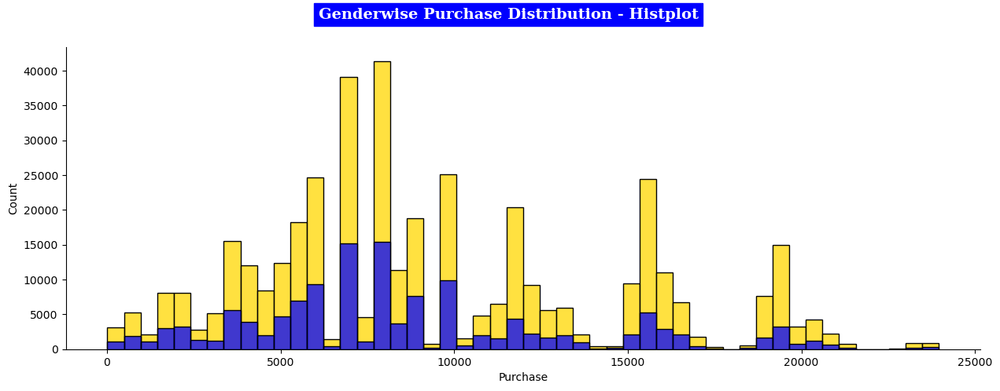

In [220]:
plt.figure(figsize=(15,5))
plt.suptitle("Genderwise Purchase Distribution - Histplot",fontsize=14,fontfamily='serif',fontweight='bold'
             ,backgroundcolor='b',color='w')
plt.style.use('seaborn-v0_8-bright')
sns.histplot(data=wm[wm['Gender']=='M']['Purchase'], bins = 50,color='gold')
sns.histplot(data=wm[wm['Gender']=='F']['Purchase'], bins = 50,color='b')
sns.despine()
plt.show()

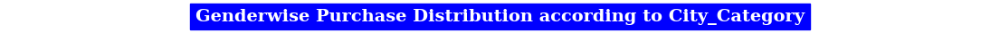

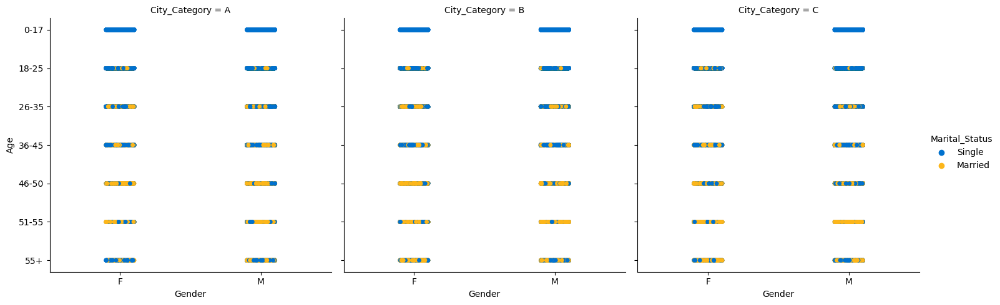

In [211]:
plt.style.use('seaborn-v0_8-bright')
plt.figure(figsize=(14,0.05))
plt.axis('off')
plt.title('Genderwise Purchase Distribution according to City_Category',fontfamily='serif',fontweight='bold',
          fontsize=14,backgroundcolor='b',color='w')
sns.catplot(x='Gender',y='Age',col='City_Category',hue='Marital_Status',data=wm,kind='strip',palette=cp2,marker='o')
plt.show()

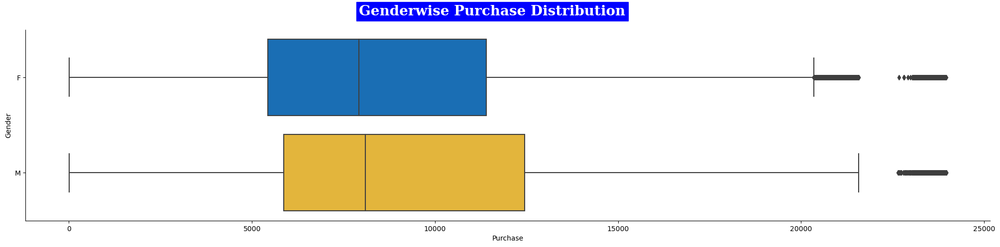

In [223]:
plt.figure(figsize=(25,5))
plt.suptitle("Genderwise Purchase Distribution",fontsize=20,fontfamily='serif',fontweight='bold'
             ,backgroundcolor='b',color='w')
plt.style.use('seaborn-v0_8-bright')
sns.boxplot(data = wm, y = "Gender", x = "Purchase" , palette=cp1)
sns.despine()
plt.show()

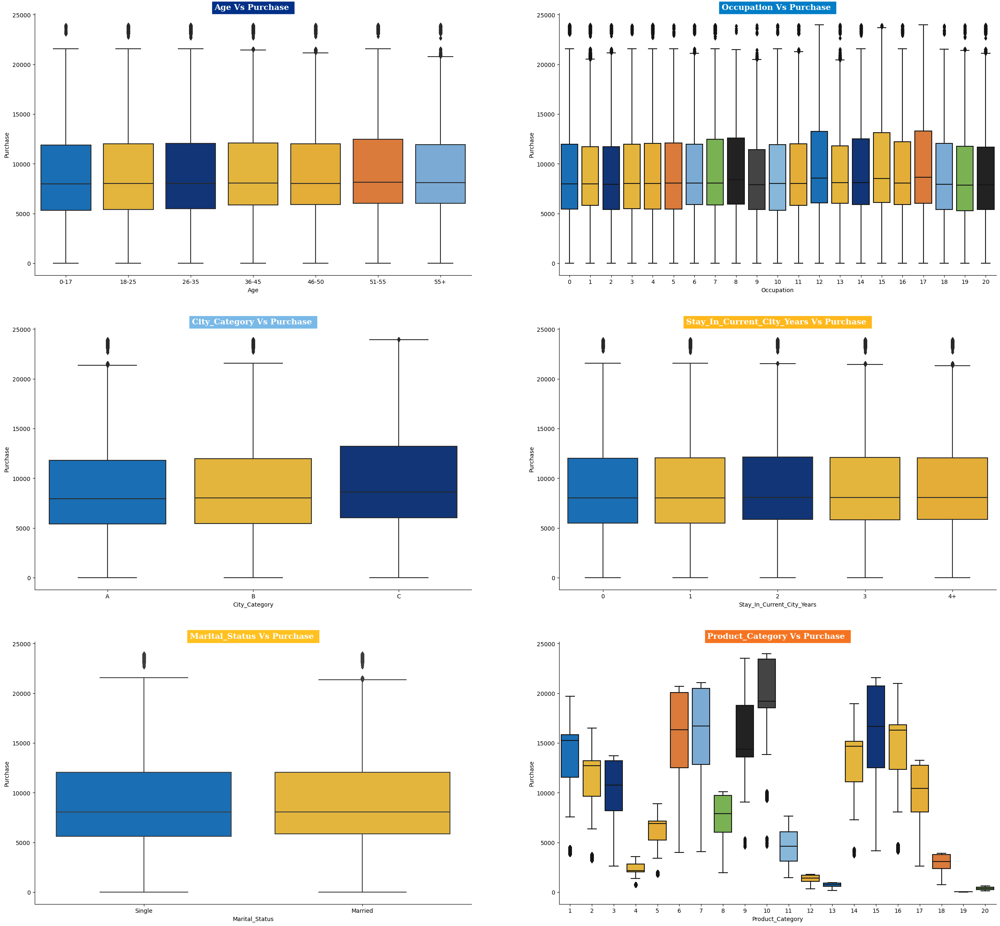

In [235]:
cat_cols = ['Age','Occupation','City_Category','Stay_In_Current_City_Years','Marital_Status', 'Product_Category']
plt.figure(figsize = (30,28))
plt.style.use('seaborn-v0_8-bright')

for i in range(len(cat_cols)):
    plt.subplot(3,2,i+1)
    sns.boxplot(data = wm, x = cat_cols[i], y='Purchase', palette = cp3)
    sns.despine()
    plt.title(f'{cat_cols[i]} Vs Purchase ',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor=cp[i],color='w')

🧐 **Observation**
- Out of all the variables analysed above, it's noteworthy that the purchase amount remains `relatively stable` regardless of the variable under consideration. As indicated in the data, the `median purchase amount` consistently hovers around `8,000 USD`, regardless of the specific variable being examined.

----

#### 🔖Q. Top 10 products and product_category based on Black Friday sales :

In [104]:
tspc = wm.groupby(['Product_Category']).agg(cnt=('User_ID','count'))[:10]
tspc = tspc.sort_values(by='cnt',ascending=False).reset_index()
tspc

,Product_Category,cnt
0,5,150933
1,1,140378
2,8,113925
3,2,23864
4,6,20466
5,3,20213
6,4,11753
7,10,5125
8,7,3721
9,9,410


In [120]:
tsp = wm.groupby(['Product_ID']).agg(cnt=('User_ID','count'))[:10]
tsp = tsp.sort_values(by='cnt',ascending=False).reset_index()
tsp

,Product_ID,cnt
0,P00000142,1152
1,P00000642,512
2,P00001042,503
3,P00000242,376
4,P00000342,244
5,P00000742,241
6,P00000542,149
7,P00000442,92
8,P00000942,55
9,P00000842,36


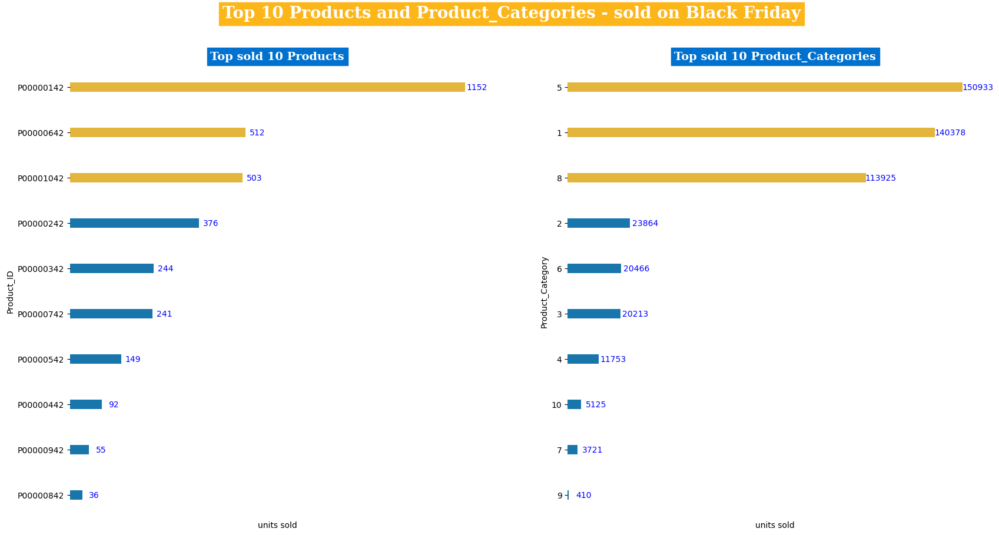

In [171]:
plt.figure(figsize=(20,10))
plt.style.use('default')
plt.style.use('seaborn-v0_8-bright')
plt.suptitle('Top 10 Products and Product_Categories - sold on Black Friday',fontfamily='serif',fontweight='bold',fontsize=20,
              backgroundcolor=cp2[1],color='w')

color_map =  ['#ffc120' for i in range(3)] + ["#007dc6" for i in range(7)]

plt.subplot(1,2,2)
sns.barplot(y=tspc['Product_Category'] , x=tspc['cnt'],order=tspc['Product_Category'],palette=color_map,width=0.2)
#sns.scatterplot(y=tspc['Product_Category'],x=tspc['cnt'],palette=color_map,s=120)
sns.despine(left=True,bottom=True,trim=True)
plt.title('Top sold 10 Product_Categories',fontfamily='serif',fontweight='bold',fontsize=14,backgroundcolor=cp2[0],color='w')
plt.xlabel('units sold')
plt.xticks([])
n=10
for i in range(n):
    plt.annotate(tspc.cnt[i], (tspc.cnt[i]+5700,i+0.1),ha='center' , va='bottom' , color='b')

plt.subplot(1,2,1)
sns.barplot(y=tsp['Product_ID'] , x=tsp['cnt'],order=tsp['Product_ID'],palette=color_map,width=0.2)
#sns.scatterplot(y=tsp['Product_ID'] , x=tsp['cnt'],palette=color_map,s=120)
sns.despine(left=True,bottom=True,trim=True)
plt.title('Top sold 10 Products',fontfamily='serif',fontweight='bold',fontsize=14,backgroundcolor=cp2[0],color='w')
plt.xlabel('units sold')
plt.xticks([])

n=10
for i in range(n):
    plt.annotate(tsp.cnt[i], (tsp.cnt[i]+35,i+0.1),ha='center' , va='bottom' , color='b')

plt.show()

#### 🏷️Insights

- **Top 10 Products Sold** 
    - The top-selling products during Walmart's Black Friday sales are characterized by a `relatively small variation` in sales numbers, suggesting that Walmart offers a variety of products that many different customers like to buy.


- **Top 10 Product Categories** 
    - Categories `5,1 and 8` have significantly outperformed other categories with combined Sales of nearly `75%` of the total sales suggesting a strong preference for these products among customers.

----

#### **Multivariate Anlaysis**

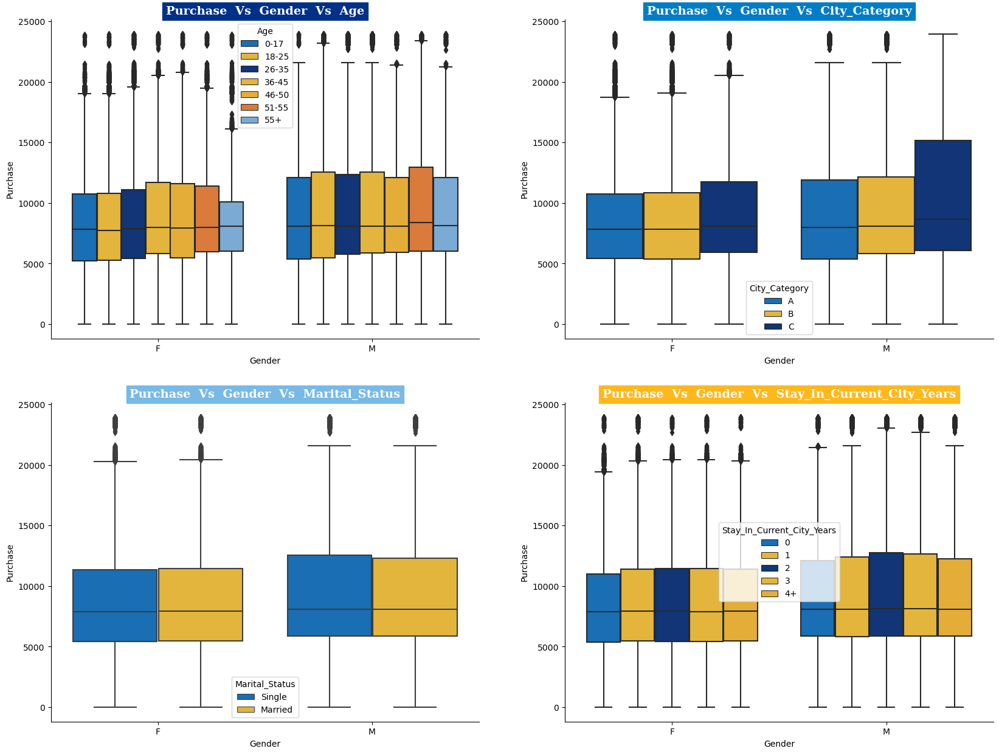

In [180]:
cat_cols = ['Age','City_Category','Marital_Status','Stay_In_Current_City_Years']

plt.figure(figsize = (20,15))
plt.style.use('seaborn-v0_8-bright')
for i in range(len(cat_cols)):
    plt.subplot(2,2,i+1)
    sns.boxplot(data = wm, x = 'Gender', y= 'Purchase',hue = cat_cols[i], palette = cp3)
    sns.despine()
    plt.title(f'Purchase  Vs  Gender  Vs  {cat_cols[i]}', fontsize = 14,fontfamily='serif',fontweight='bold'
              ,backgroundcolor=cp[i],color='w')

In [182]:
wm.columns

Index(['User_ID', 'Product_ID', 'Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category',
       'Purchase'],
      dtype='object')

In [187]:
wmcorr = wm[['Occupation', 'Product_Category','Purchase']].corr()
wmcorr

,Occupation,Product_Category,Purchase
Occupation,1.000000,-0.007618,0.020833
Product_Category,-0.007618,1.000000,-0.343703
Purchase,0.020833,-0.343703,1.000000


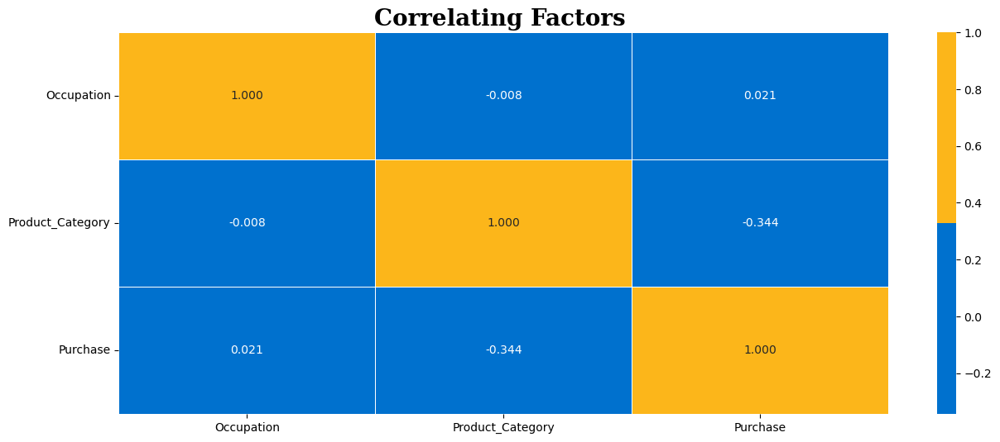

In [192]:
#Correlation HeatMap
plt.figure(figsize=(15,6))
ax = sns.heatmap(wmcorr,annot=True,fmt='.3f',linewidths=.5,cmap=cp2)
plt.title('Correlating Factors ',fontfamily='serif',fontweight='bold',fontsize=20)
plt.yticks(rotation=0)
plt.show()

<Figure size 640x480 with 0 Axes>

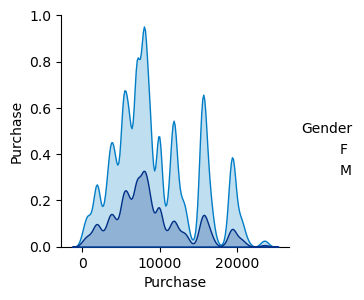

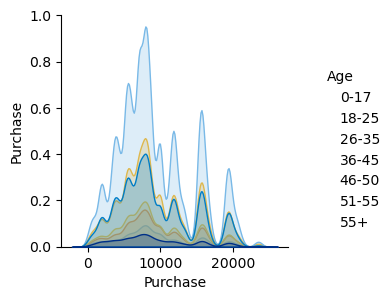

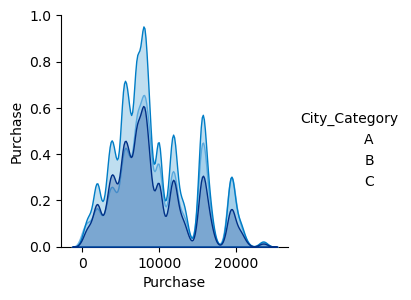

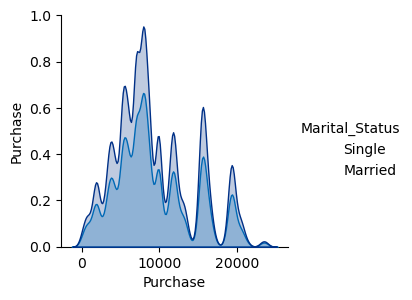

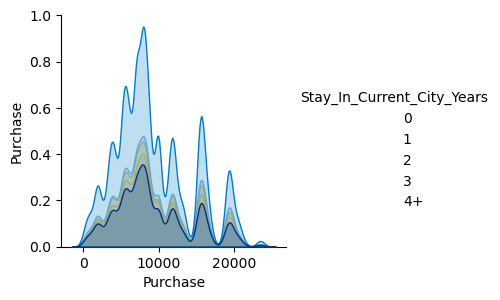

In [213]:
# Pairplot Analysis
cat_cols = ['Gender','Age','City_Category','Marital_Status','Stay_In_Current_City_Years']
plt.suptitle(f'Pairplot based on Purchase',fontfamily='serif',fontweight='bold',fontsize=12,backgroundcolor=cp[0],color='w')
for i in range(len(cat_cols)):
    sns.pairplot(wm,y_vars = "Purchase",hue=cat_cols[i],kind='reg',palette=cp,height=3)
    plt.show()

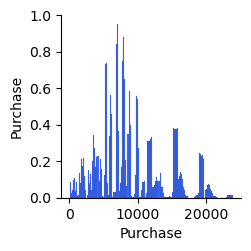

In [214]:
sns.pairplot(wm)

-----
### 🔖Q.Difference between the mean and median value of the purchase amount:

In [215]:
avg_purchase = wm.Purchase.mean() 
avg_purchase

9263.968712959126

In [216]:
median_purchase = wm.Purchase.median()    
median_purchase

8047.0

In [217]:
Difference = avg_purchase - median_purchase
Difference

1216.9687129591257

#### 🔖Q. Tracking the amount spent per transaction of all the 50 million female customers,and all the 50 million male customers,calculate the average, and conclude the results.


In [218]:
avg_purchase_amt = wm.groupby('Gender')[['Purchase']].mean().reset_index().round(2)
avg_purchase_amt

,Gender,Purchase
0,F,8734.57
1,M,9437.53



### 🏷️ Insights

- The Difference between the Mean and Median value of the numerical column `Purchase_amt` is found to be **1216.97**.

- The Average amount spent by **Male Customer** is `9437.53` which is substancially higher than **Female Customers** is `8734.57`.


In [219]:
wm_male = wm[wm['Gender']=='M']
wm_female = wm[wm['Gender']=='F']

In [220]:
len(wm_male)

414259

In [222]:
len(wm_female)

135809

In [229]:
# total purchase split by gender
psg = wm.groupby(['User_ID','Gender'])[['Purchase']].sum()
tpsg = psg[psg['Purchase']!=0]
tpsg.reset_index(inplace=True)
tpsg

,User_ID,Gender,Purchase
0,1000001,F,334093
1,1000002,M,810472
2,1000003,M,341635
3,1000004,M,206468
4,1000005,M,821001
...,...,...,...
5886,1006036,F,4116058
5887,1006037,F,1119538
5888,1006038,F,90034
5889,1006039,F,590319


In [232]:
tpsg.Gender.value_counts().to_frame()

,count
Gender,
M,4225
F,1666


In [236]:
tpsg.groupby('Gender').agg(avg_purchase_amt=('Purchase','mean')).round(2)

,avg_purchase_amt
Gender,
F,712024.39
M,925344.40


In [275]:
wm.groupby('Gender')['Purchase'].describe().T

Gender,F,M
count,135809.000000,414259.00000
mean,8734.565765,9437.52604
std,4767.233289,5092.18621
min,12.000000,12.00000
25%,5433.000000,5863.00000
50%,7914.000000,8098.00000
75%,11400.000000,12454.00000
max,23959.000000,23961.00000


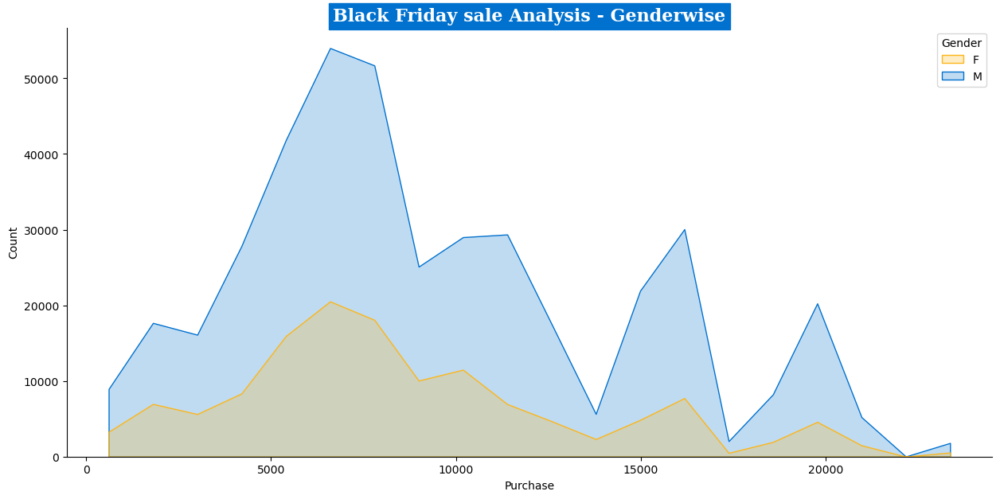

In [392]:
plt.figure(figsize=(15,7))
sns.histplot(data=wm, x = "Purchase", bins=20, hue = "Gender",element='poly',palette=cp2[::-1])
sns.despine()
plt.title('Black Friday sale Analysis - Genderwise',fontfamily='serif',fontweight='bold',fontsize=16,backgroundcolor=cp2[0],color='w')
plt.show()

In [252]:
male_purchase = tpsg[tpsg['Gender']=='M']['Purchase']
male_purchase

1        810472
2        341635
3        206468
4        821001
6        234668
         ...   
5880     737361
5882     517261
5883     501843
5884     197086
5890    1653299
Name: Purchase, Length: 4225, dtype: int64

In [253]:
female_purchase = tpsg[tpsg['Gender']=='F']['Purchase']
female_purchase

0        334093
5        379930
9       2169510
10       557023
15       150490
         ...   
5885     956645
5886    4116058
5887    1119538
5888      90034
5889     590319
Name: Purchase, Length: 1666, dtype: int64

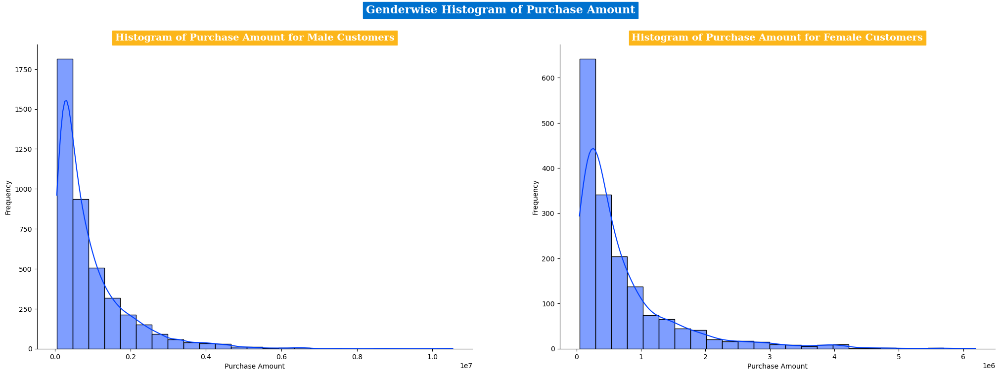

In [254]:
plt.figure(figsize=(25,8))
plt.style.use('default')
plt.style.use('seaborn-v0_8-bright')
plt.suptitle('Genderwise Histogram of Purchase Amount',fontfamily='serif',fontweight='bold',fontsize=16,
              backgroundcolor=cp2[0],color='w')

plt.subplot(1,2,1)
sns.histplot(male_purchase, bins=25,kde=True)
plt.title("Histogram of Purchase Amount for Male Customers",fontfamily='serif',fontweight='bold',fontsize=14,
              backgroundcolor=cp2[1],color='w')
plt.xlabel("Purchase Amount")
plt.ylabel("Frequency")

plt.subplot(1,2,2)
sns.histplot(female_purchase, bins=25,kde=True)
plt.title("Histogram of Purchase Amount for Female Customers",fontfamily='serif',fontweight='bold',fontsize=14,
              backgroundcolor=cp2[1],color='w')
sns.despine()
plt.xlabel("Purchase Amount")
plt.ylabel("Frequency")
plt.show()

#### 🏷️Insights:

- **Male customers spent more money than female customers** during the `Black Friday` sale.

    - The number of total **Males** (`4225`) is ***greater*** than number of total **Females** (`1666`).
    
    - Average amount spend by **Male customers** (`925344.40`) is ***greater*** than Average amount spend by **Female customers**(`712024.39`).
    
    - There are more male customers than female customers, hence the male customers will tend to buy more than female customers.

    - There could be more products suited to males than the female products which could lead to increase in sales of the products bought by men.


### 🔀This data seems like lognormal distributed curve and also Right skewed. lets try boxcox to get the normal distribution.

In [256]:
transformed_data_male_purchase , m_best_lambda = boxcox(male_purchase)
print(f"Best lambda for male purchase = {m_best_lambda}")
transformed_data_female_purchase , f_best_lambda = boxcox(female_purchase)
print(f"Best lambda for female purchase = {f_best_lambda}")

Best lambda for male purchase = -0.0396131636344579
Best lambda for female purchase = -0.13352643386543317


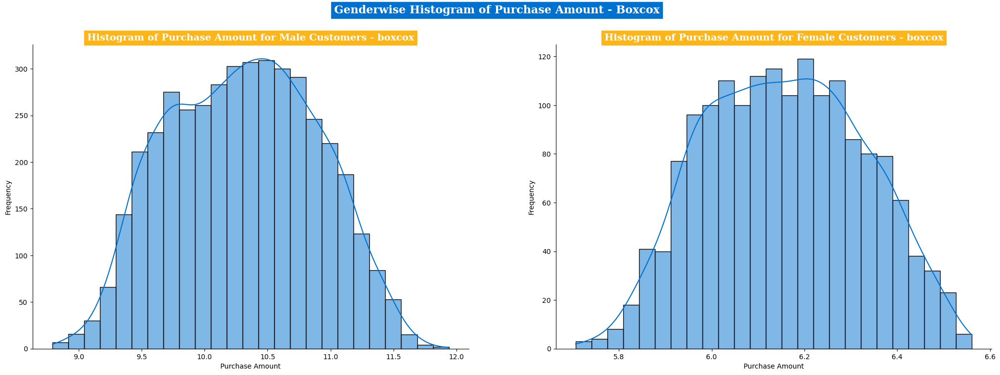

In [260]:
plt.figure(figsize=(25,8))
plt.style.use('default')
plt.style.use('seaborn-v0_8-bright')
plt.suptitle('Genderwise Histogram of Purchase Amount - Boxcox',fontfamily='serif',fontweight='bold',fontsize=16,
              backgroundcolor=cp2[0],color='w')

plt.subplot(1,2,1)
sns.histplot(transformed_data_male_purchase, bins=25,kde=True,color=cp2[0],cbar=True)
plt.title("Histogram of Purchase Amount for Male Customers - boxcox",fontfamily='serif',fontweight='bold',fontsize=14,
              backgroundcolor=cp2[1],color='w')
plt.xlabel("Purchase Amount")
plt.ylabel("Frequency")

plt.subplot(1,2,2)
sns.histplot(transformed_data_female_purchase, bins=25,kde=True,color=cp2[0])
plt.title("Histogram of Purchase Amount for Female Customers - boxcox",fontfamily='serif',fontweight='bold',fontsize=14,
              backgroundcolor=cp2[1],color='w')
sns.despine()
plt.xlabel("Purchase Amount")
plt.ylabel("Frequency")plt.show()

In [273]:
n_female = len(female_purchase)
mean_female = female_purchase.mean()

population_std_dev = female_purchase.std()

#confidence level (95%)
confidence_level = 0.95

z_stat, p_value = ztest(female_purchase, value=population_std_dev)


lower_bound = mean_female - (z_stat * (population_std_dev / (n_female**0.5)))
upper_bound = mean_female + (z_stat * (population_std_dev / (n_female**0.5)))

print(f"Female Sample Mean: {mean_female}")
print(f"Z-statistic: {z_stat}")
print(f"P-value: {p_value}")
print(f"Confidence Interval: ({lower_bound}, {upper_bound})")

Female Sample Mean: 712024.3949579832
Z-statistic: -4.820238048690314
P-value: 1.4338702083630263e-06
Confidence Interval: (807370.7261464577, 616678.0637695086)


In [272]:
n_male = len(male_purchase)
mean_male = male_purchase.mean()

population_std_dev = male_purchase.std()

#confidence level (95%)
confidence_level = 0.95

z_stat, p_value = ztest(male_purchase, value=population_std_dev)

lower_bound = mean_male - (z_stat * (population_std_dev / (n_female**0.5)))
upper_bound = mean_male + (z_stat * (population_std_dev / (n_female**0.5)))

print(f"Male Sample Mean: {mean_male}")
print(f"Z-statistic: {z_stat}")
print(f"P-value: {p_value}")
print(f"Confidence Interval: ({lower_bound}, {upper_bound})")

Male Sample Mean: 925344.4023668639
Z-statistic: -3.9880811051336282
P-value: 6.660989296222788e-05
Confidence Interval: (1021667.0824554558, 829021.722278272)


### 👢**Bootstrapping & Central Limit Theorem**

#### ▶️〰️◀️Confidence intervals and distribution of the mean of the expenses based on customers Age

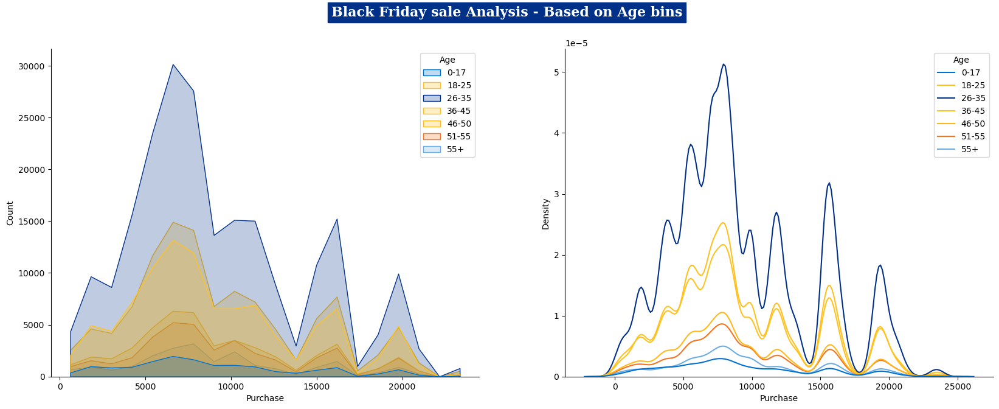

In [419]:
plt.figure(figsize=(20,7))
plt.suptitle('Black Friday sale Analysis - Based on Age bins',fontfamily='serif',fontweight='bold',
          fontsize=16,backgroundcolor=cp[0],color='w')

plt.subplot(1,2,1)
sns.histplot(data=wm, x = "Purchase", bins=20, hue = "Age",element='poly',palette=cp3)

plt.subplot(1,2,2)
sns.kdeplot(data=wm, x = "Purchase", hue = "Age",palette=cp3)
sns.despine()
plt.show()

In [505]:
def bootstrapping_age(age_grp,data,sample_size,ntimes,ci):
    
    plt.figure(figsize=(25,6.5))
    plt.style.use('seaborn-v0_8-bright')
    plt.suptitle(f'Classfification of Customers based on Age',
              fontfamily='serif', fontweight='bold', fontsize=16, backgroundcolor='#ffb81c', color='w')
    
    data_sample_means = []
    for i in range(ntimes):
        dsm = np.mean(np.random.choice(data,sample_size))
        data_sample_means.append(dsm)
    
    ci = ci/100
    
    # data_sample_means parameters
    mean = np.mean(data_sample_means)
    sigma = np.std(data_sample_means)
    std_err_of_mean = stats.sem(data_sample_means)   # sem auto calculates the std.err for mean
    
    lower_limit = norm.ppf((1-ci)/2) * sigma + mean
    upper_limit = norm.ppf(ci+(1-ci)/2) * sigma + mean
    
    # plot1 # for mu = alt+230
    sns.kdeplot(data = data_sample_means, color=cp2[1], fill = True, linewidth = 2)
    label_mean = (f" μ :  {mean:.2f}")
    plt.axvline(mean, color = 'darkblue', linestyle = 'solid', linewidth = 2, label=label_mean)
    label_limits=(f"Lower Limit : {lower_limit:.2f}\nUpper Limit :  {upper_limit:.2f}")
    plt.axvline(lower_limit, color = 'goldenrod', linestyle = 'dashdot', linewidth = 2, label=label_limits)
    plt.axvline(upper_limit, color = 'goldenrod', linestyle = 'dashdot', linewidth = 2)
    sns.despine()
    
    plt.title(f"Sample Size: {sample_size} with Confidence Interval: {ci*100}%  for age_group- {age_grp}",
          fontfamily='serif', fontweight='bold', fontsize=14, backgroundcolor='darkblue', color='w')
    
    plt.legend()
    plt.xlabel('Purchase Amount')
    plt.ylabel('Probability Density')
    
    return data_sample_means , round(lower_limit,2), round(upper_limit,2), round(mean,2)

In [420]:
wm.Age.nunique()

7

In [421]:
wm.Age.unique()

['0-17', '55+', '26-35', '46-50', '51-55', '36-45', '18-25']
Categories (7, object): ['0-17', '18-25', '26-35', '36-45', '46-50', '51-55', '55+']

In [422]:
wm.Age.value_counts()

Age
26-35    219587
36-45    110013
18-25     99660
46-50     45701
51-55     38501
55+       21504
0-17      15102
Name: count, dtype: int64

,Age_Group,Sample Size,Lower Limit,Upper Limit,Sample Mean,Confidence Interval,Range
0,0-17,2000,8743.37,9121.25,8932.31,90,377.88
1,18-25,2000,8980.50,9357.05,9168.77,90,376.55
2,26-35,2000,9067.37,9437.56,9252.46,90,370.19
3,36-45,2000,9142.40,9518.14,9330.27,90,375.74
4,46-50,2000,9025.40,9391.49,9208.45,90,366.09
5,51-55,2000,9346.19,9718.83,9532.51,90,372.64
6,55+,2000,9151.77,9521.66,9336.71,90,369.89
7,0-17,2000,8705.93,9157.01,8931.47,95,451.08
8,18-25,2000,8948.81,9388.77,9168.79,95,439.96
9,26-35,2000,9033.73,9472.08,9252.90,95,438.35


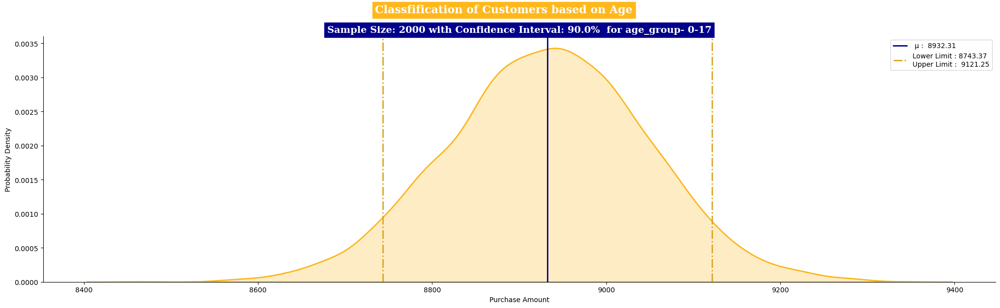

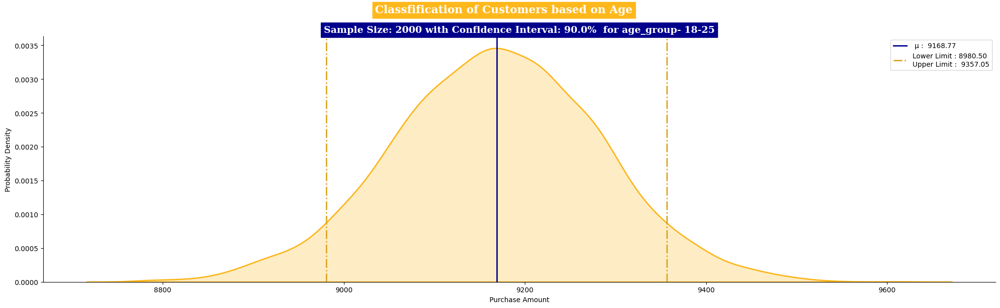

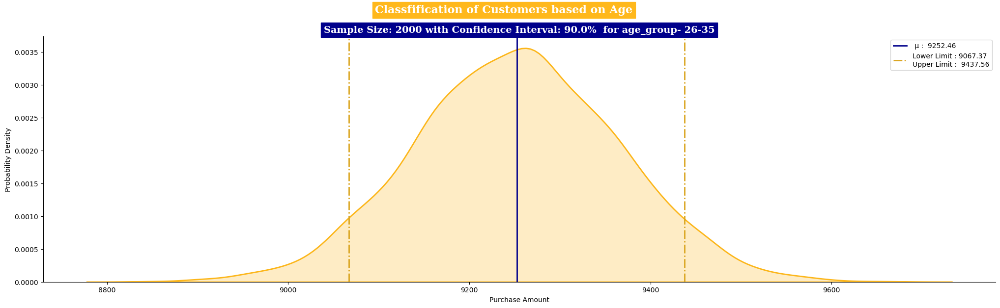

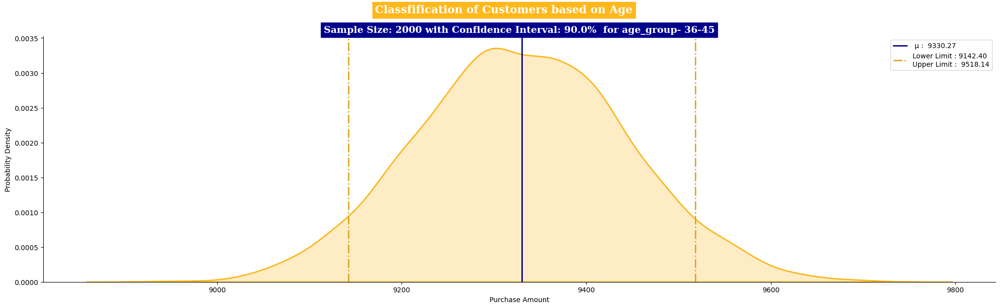

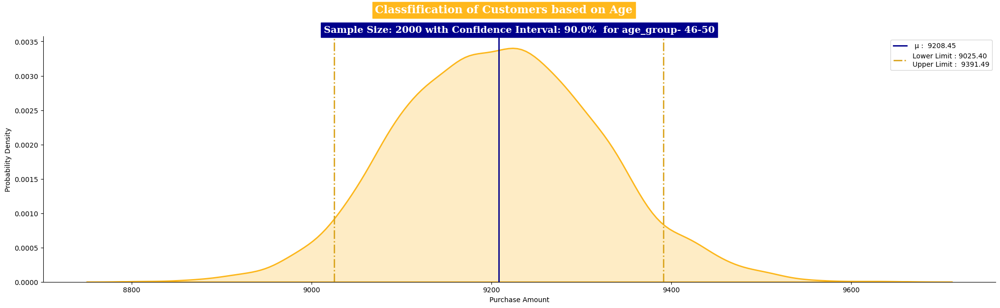

...

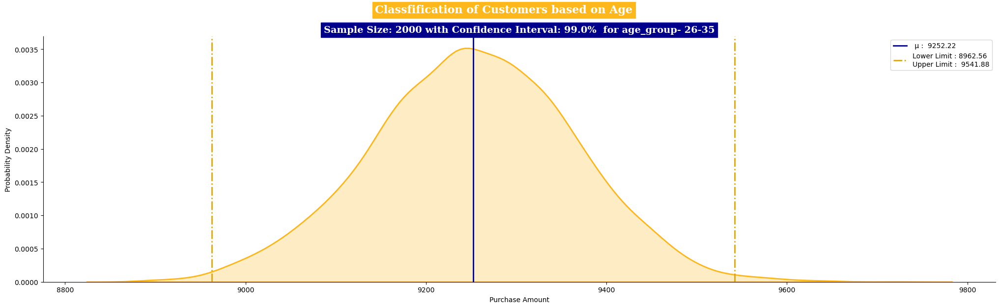

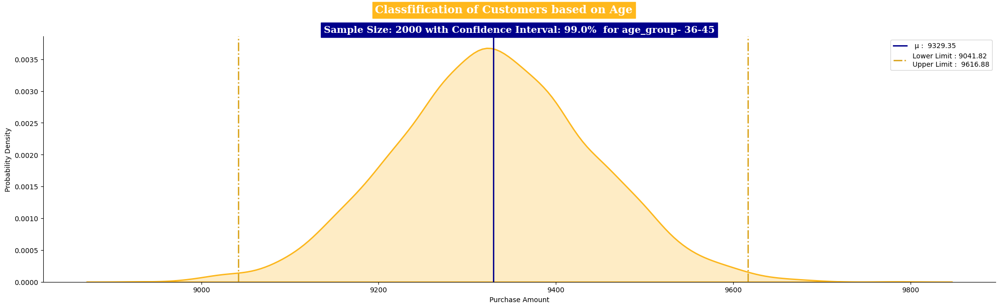

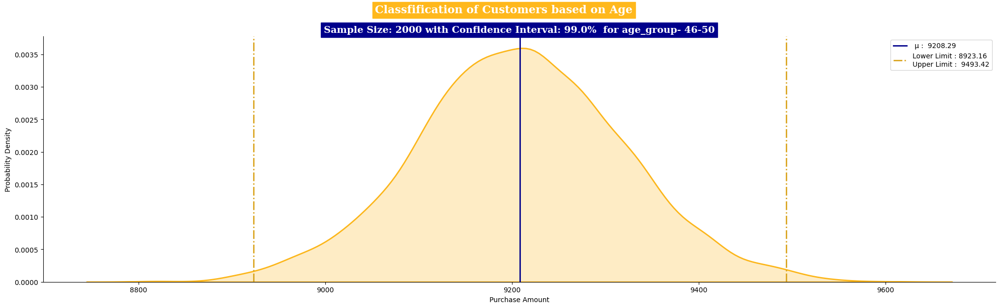

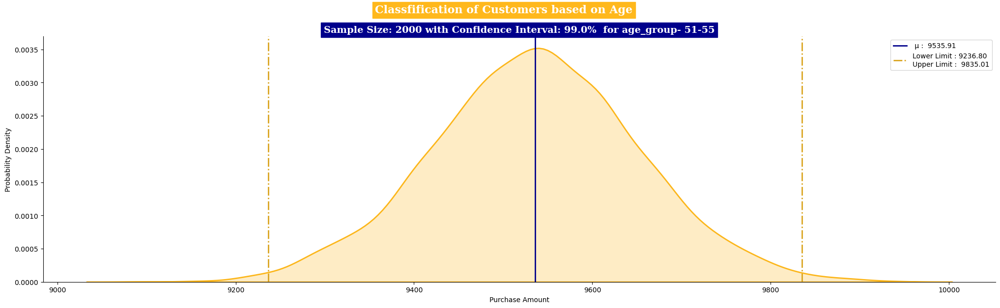

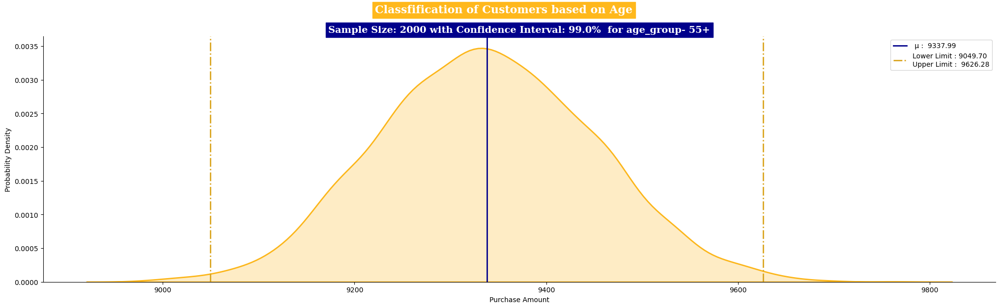

In [507]:
sample_size = 2000
ntimes = 5000
ci = [90,95,99]
age_group = ['0-17', '18-25', '26-35', '36-45', '46-50', '51-55', '55+'] 
 
df = pd.DataFrame(columns = ['Age_Group','Sample Size','Lower Limit','Upper Limit','Sample Mean','Confidence Interval','Range'])

for i in ci:
    for _ in age_group:
        age_data = wm[wm['Age']==_]['Purchase']
        avg, ll, ul, mean = bootstrapping_age( _ , age_data , sample_size , ntimes , i )
        df.loc[len(df.index)]=[ _ , sample_size , ll , ul , mean , i , (ul-ll) ]

df

#### **Distribution for sum of purchase amt for unique male and female customers**

In [514]:
age_unique_cust = wm.groupby(['User_ID', 'Age'])[['Purchase']].sum().reset_index()
age_unique_cust = age_unique_cust[age_unique_cust['Purchase']!=0]
age_unique_cust

,User_ID,Age,Purchase
0,1000001,0-17,334093
13,1000002,55+,810472
16,1000003,26-35,341635
25,1000004,46-50,206468
30,1000005,26-35,821001
...,...,...,...
41204,1006036,26-35,4116058
41213,1006037,46-50,1119538
41222,1006038,55+,90034
41227,1006039,46-50,590319


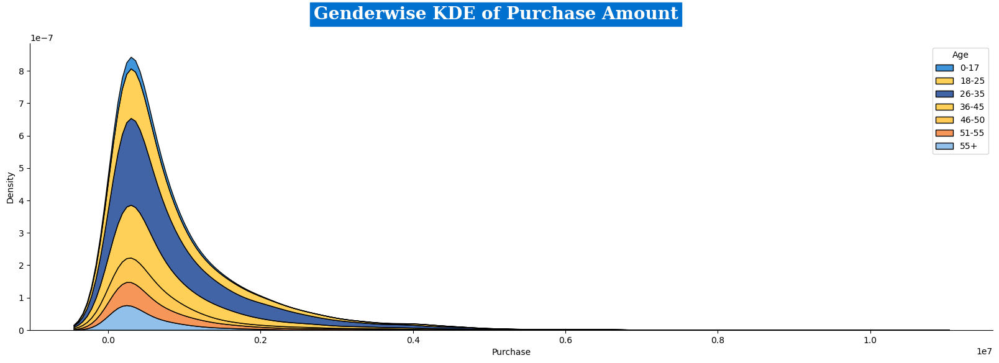

In [519]:
plt.figure(figsize=(20,6))
plt.style.use('default')
plt.style.use('seaborn-v0_8-bright')
plt.suptitle('Genderwise KDE of Purchase Amount',fontfamily='serif',fontweight='bold',fontsize=20,
              backgroundcolor=cp2[0],color='w')
sns.kdeplot(data=age_unique_cust, x='Purchase', hue='Age', multiple='stack',palette=cp3)
sns.despine()
plt.show()

,Age_Group,Sample Size,Lower Limit,Upper Limit,Sample Mean,Confidence Interval,Range
0,0-17,2000,829657.09,899786.18,864721.63,90,70129.09
1,18-25,2000,829875.21,899929.01,864902.11,90,70053.80
2,26-35,2000,829985.17,899663.34,864824.26,90,69678.17
3,36-45,2000,830966.52,900576.65,865771.58,90,69610.13
4,46-50,2000,830971.84,899893.37,865432.61,90,68921.53
5,51-55,2000,830644.34,900418.13,865531.24,90,69773.79
6,55+,2000,830905.00,899665.47,865285.23,90,68760.47
7,0-17,2000,823545.13,906293.58,864919.35,95,82748.45
8,18-25,2000,823338.42,906436.90,864887.66,95,83098.48
9,26-35,2000,823025.79,906401.29,864713.54,95,83375.50


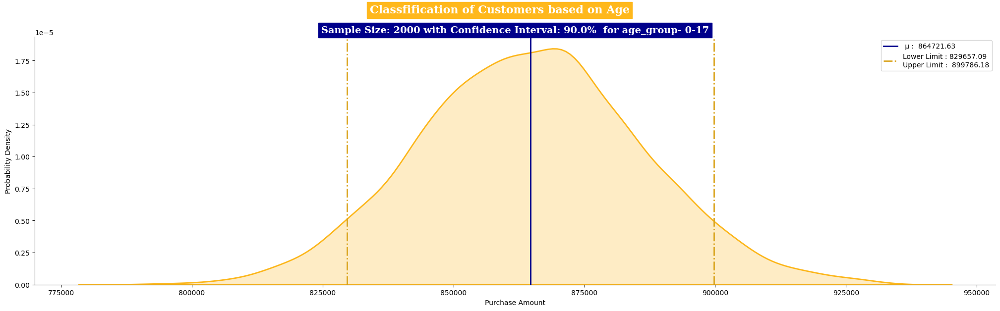

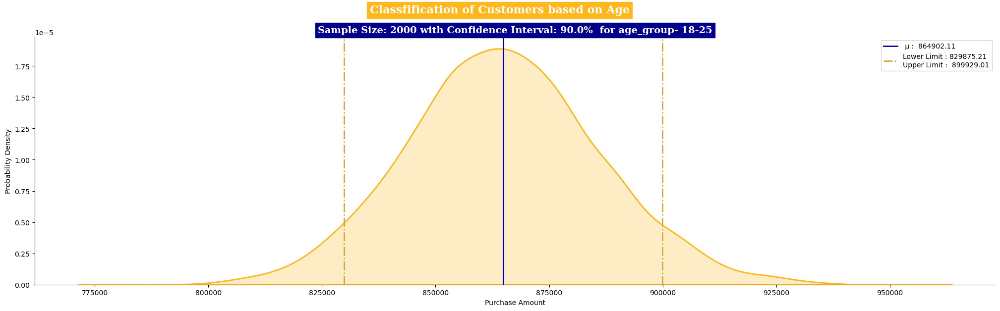

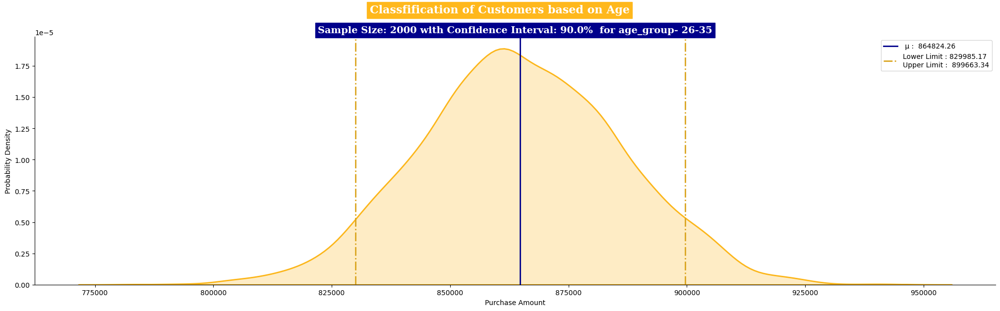

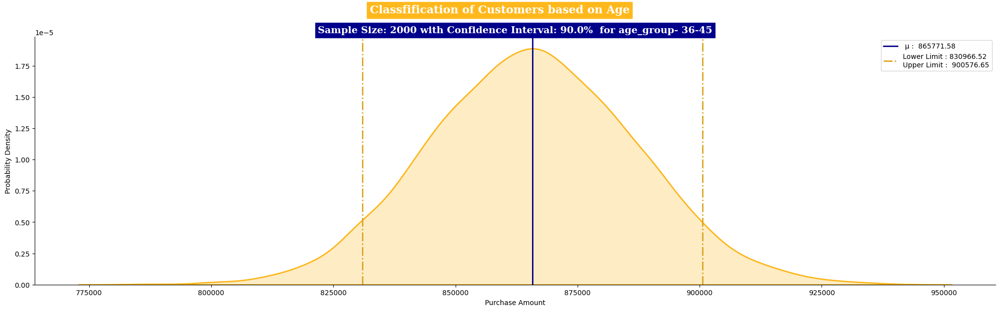

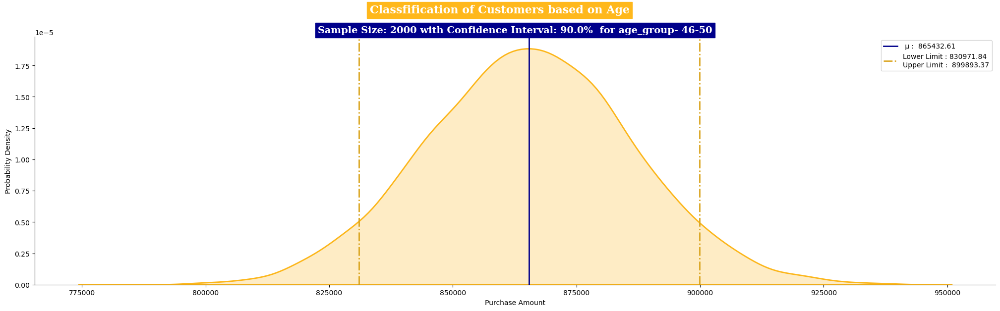

...

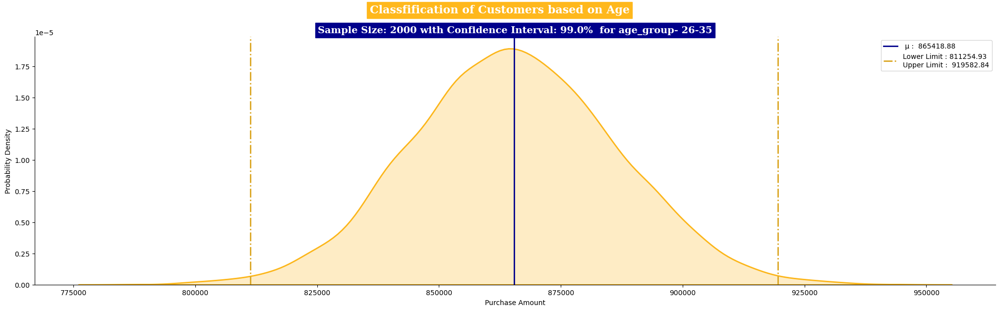

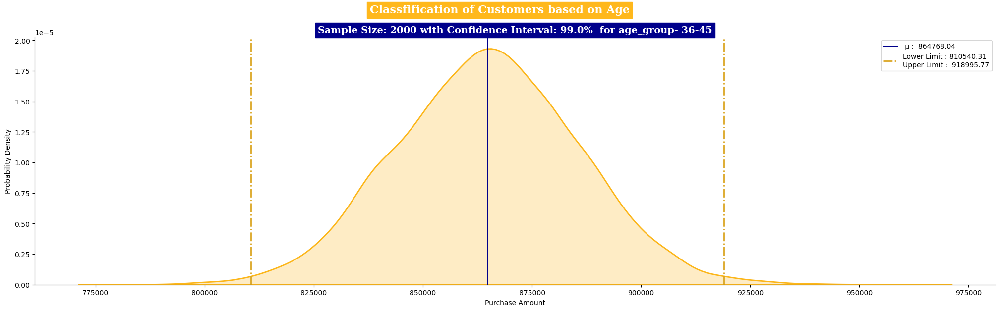

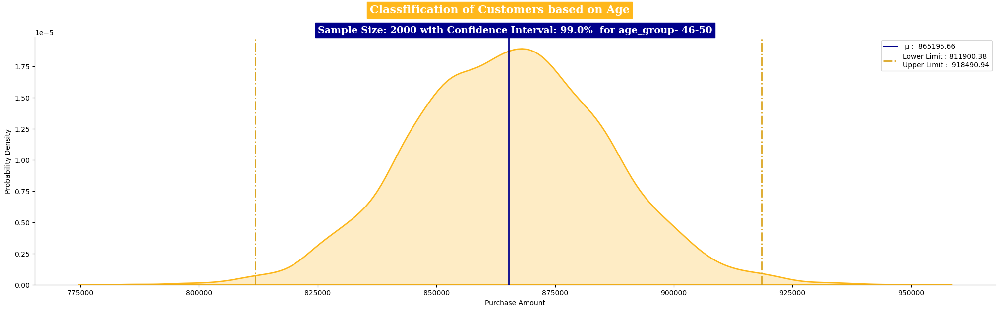

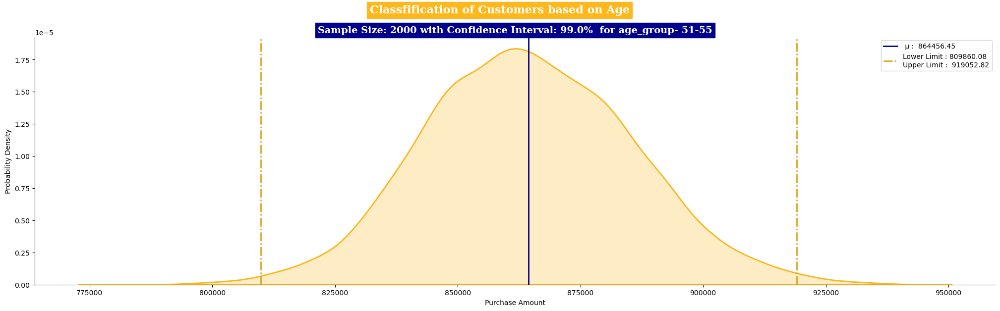

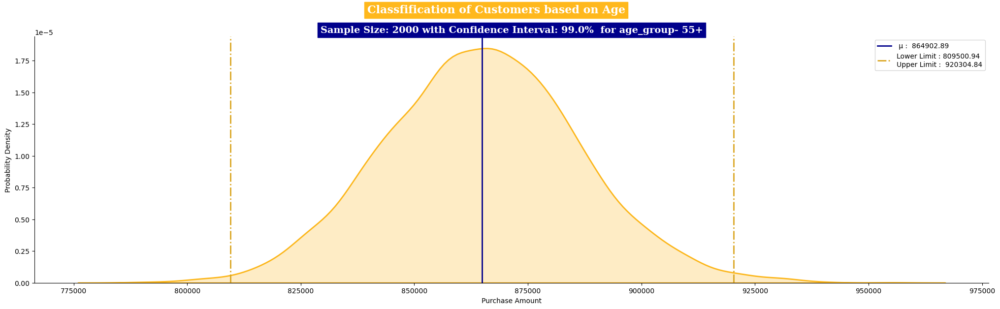

In [516]:
sample_size = 2000
ntimes = 5000
ci = [90,95,99]
age_group = ['0-17', '18-25', '26-35', '36-45', '46-50', '51-55', '55+'] 
 
df = pd.DataFrame(columns = ['Age_Group','Sample Size','Lower Limit','Upper Limit','Sample Mean','Confidence Interval','Range'])

for i in ci:
    for _ in age_group:
        age_data = age_unique_cust['Purchase']
        avg, ll, ul, mean = bootstrapping_age( _ , age_data , sample_size , ntimes , i )
        df.loc[len(df.index)]=[ _ , sample_size , ll , ul , mean , i , (ul-ll) ]

df

#### ▶️〰️◀️Confidence intervals and distribution of the mean of the expenses based on female and male customers 

In [376]:
def bootstrapping(title,data1,data2,sample_size,ntimes,ci):
    
    plt.figure(figsize=(20,8))
    plt.style.use('seaborn-v0_8-bright')
    plt.suptitle(f'Classfification of Customers based on {title}',
              fontfamily='serif', fontweight='bold', fontsize=16, backgroundcolor='#ffb81c', color='w')
    
    ci=ci/100
    
    data1_sample_means = [np.mean(np.random.choice(data1,sample_size)) for i in range(ntimes)]
    
    data2_sample_means = []
    for i in range(ntimes):
        dsm2 = np.mean(np.random.choice(data2,sample_size))
        data2_sample_means.append(dsm2)
    
    
    # male_data_sample_means parameters
    mean1 = np.mean(data1_sample_means)
    sigma1 = np.std(data1_sample_means)
    stderr1 = stats.sem(data1_sample_means)   # sem auto calculates the std.err for mean
    
    lower_limit_1 = norm.ppf((1-ci)/2) * sigma1 + mean1
    upper_limit_1 = norm.ppf(ci+(1-ci)/2) * sigma1 + mean1
       
    # For female_data_sample_means parameters
    mean2 = np.mean(data2_sample_means)
    sigma2 = np.std(data2_sample_means)
    stderr2 = stats.sem(data2_sample_means)  
    
    lower_limit_2 = norm.ppf((1-ci)/2) * sigma2 + mean2
    upper_limit_2 = norm.ppf(ci + (1-ci)/2) * sigma2 + mean2
    
    # plot1 # for mu = alt+230
    sns.kdeplot(data = data1_sample_means, color=cp2[0], fill = True, linewidth = 2)
    label_mean1 = (f" μ (Males):  {mean1:.2f}")
    plt.axvline(mean1, color = 'darkblue', linestyle = 'solid', linewidth = 2, label=label_mean1)
    label_limits1=(f"Lower Limit(M): {lower_limit_1:.2f}\nUpper Limit(M):  {upper_limit_1:.2f}")
    plt.axvline(lower_limit_1, color = 'dodgerblue', linestyle = 'dashdot', linewidth = 2, label=label_limits1)
    plt.axvline(upper_limit_1, color = 'dodgerblue', linestyle = 'dashdot', linewidth = 2)
    
    #plot2
    sns.kdeplot(data = data2_sample_means, color=cp2[1], fill = True, linewidth = 2)
    sns.despine()
    label_mean2 = (f" μ (Females): {mean2:.2f}")
    plt.axvline(mean2, color = 'gold', linestyle = 'solid', linewidth = 2, label=label_mean2)
    label_limits2=(f"Lower Limit(F): {lower_limit_2:.2f}\nUpper Limit(F): {upper_limit_2:.2f}")
    plt.axvline(lower_limit_2, color = 'goldenrod', linestyle = 'dashdot', linewidth = 2, label=label_limits2)
    plt.axvline(upper_limit_2, color = 'goldenrod', linestyle = 'dashdot', linewidth = 2)
    
    plt.title(f"Sample Size: {sample_size} with Confidence Interval: {ci*100}% ",
              #, Male Avg: {np.round(mean1, 2)} , Male SME: {np.round(stderr1, 2)} ,"
              #f" Female Avg: {np.round(mean2, 2)} , Female SME: {np.round(stderr2, 2)}
          fontfamily='serif', fontweight='bold', fontsize=14, backgroundcolor='#003087', color='w')
    
    plt.legend()
    plt.xlabel('Purchase Amount')
    plt.ylabel('Probability Density')
    
    return round(mean1,2), round(mean2,2), round(lower_limit_1,2), round(upper_limit_1,2), round(lower_limit_2,2), round(upper_limit_2,2)

#### 〽️**Lets plot the mean of 10000 Random Samples of sizes 50,500,5000,50000 and 100000 with 90%,95%,99% Confidence Interval**

### **MALE  & FEMALE**

#### ✅ **90% CI**

In [522]:
norm.ppf(0.95)

1.6448536269514722

In [530]:
sample_male = male_purchase.sample(500)
z_score_90 = norm.ppf(0.9).round(2)
z_score_95 = norm.ppf(0.95).round(2)
z_score_99 = norm.ppf(0.99).round(2)
print(f"Male purchase amount - Confidence interval :")
male_pop_mean = np.mean(sample_male).round(2)
print(f"Population purchase mean for male : {male_pop_mean}")
pop_std_dev = np.round(np.std(sample_male),2)
print(f"Population purchase standard deviation for male : {pop_std_dev}")
print()
se = pop_std_dev/np.sqrt(500)
x1 =  (male_pop_mean - (z_score_90 * se)).round(2)
x2 =  (male_pop_mean + (z_score_90 * se)).round(2)
print(f"The 90% confidence interval --> $ {x1} to $ {x2}")
x1 =  (male_pop_mean - (z_score_95 * se)).round(2)
x2 =  (male_pop_mean + (z_score_95 * se)).round(2)
print(f"The 95% confidence interval --> $ {x1} to $ {x2}")
x1 =  (male_pop_mean - (z_score_99 * se)).round(2)
x2 =  (male_pop_mean + (z_score_99 * se)).round(2)
print(f"The 99% confidence interval --> $ {x1} to $ {x2}")

Male purchase amount - Confidence interval :
Population purchase mean for male : 936263.85
Population purchase standard deviation for male : 1040459.91

The 90% confidence interval --> $ 876704.45 to $ 995823.25
The 95% confidence interval --> $ 859953.37 to $ 1012574.33
The 99% confidence interval --> $ 827847.13 to $ 1044680.57


In [529]:
sample_female = female_purchase.sample(500)
z_score_90 = norm.ppf(0.9).round(2)
z_score_95 = norm.ppf(0.95).round(2)
z_score_99 = norm.ppf(0.99).round(2)
print(f"Female purchase amount - Confidence interval :")
male_pop_mean = np.mean(sample_female).round(2)
print(f"Population purchase mean for Female : {male_pop_mean}")
pop_std_dev = np.round(np.std(sample_female),2)
print(f"Population purchase standard deviation for Female : {pop_std_dev}")
print()
se = pop_std_dev/np.sqrt(500)
x1 =  (male_pop_mean - (z_score_90 * se)).round(2)
x2 =  (male_pop_mean + (z_score_90 * se)).round(2)
print(f"The 90% confidence interval --> $ {x1} to $ {x2}")
x1 =  (male_pop_mean - (z_score_95 * se)).round(2)
x2 =  (male_pop_mean + (z_score_95 * se)).round(2)
print(f"The 95% confidence interval --> $ {x1} to $ {x2}")
x1 =  (male_pop_mean - (z_score_99 * se)).round(2)
x2 =  (male_pop_mean + (z_score_99 * se)).round(2)
print(f"The 99% confidence interval --> $ {x1} to $ {x2}")

Female purchase amount - Confidence interval :
Population purchase mean for Female : 698817.74
Population purchase standard deviation for Female : 794086.24

The 90% confidence interval --> $ 653361.59 to $ 744273.89
The 95% confidence interval --> $ 640577.05 to $ 757058.43
The 99% confidence interval --> $ 616073.34 to $ 781562.14


,Gender,Sample Size,Lower Limit,Upper Limit,Sample Mean,Confidence Interval,Range
0,M,50,699904.08,1154041.50,926972.79,90,454137.42
1,F,50,526925.34,901181.41,714053.38,90,374256.07
2,M,500,851689.13,998811.43,925250.28,90,147122.30
3,F,500,653026.15,771061.54,712043.85,90,118035.39
4,M,5000,902132.09,948173.62,925152.86,90,46041.53
5,F,5000,693652.69,730709.55,712181.12,90,37056.86
6,M,50000,918099.48,932592.67,925346.08,90,14493.19
7,F,50000,706070.75,718004.59,712037.67,90,11933.84
8,M,100000,920122.91,930428.04,925275.47,90,10305.13
9,F,100000,707810.01,716260.08,712035.05,90,8450.07


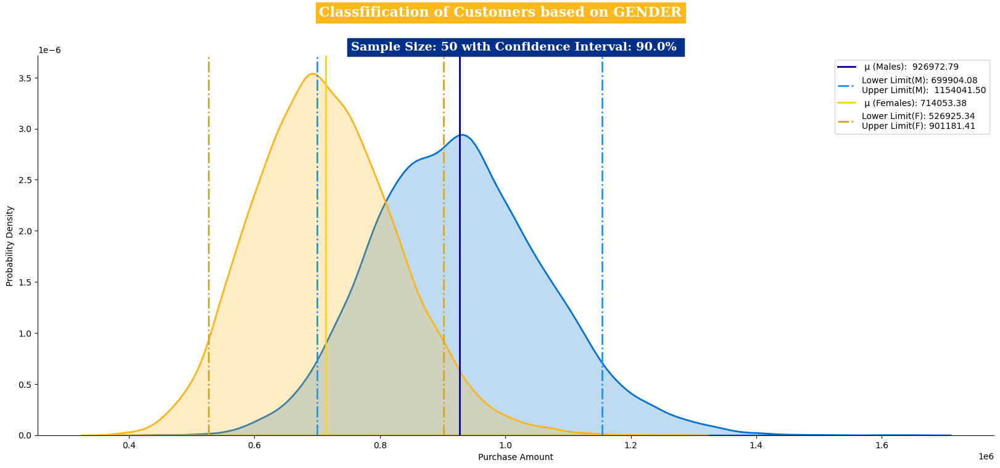

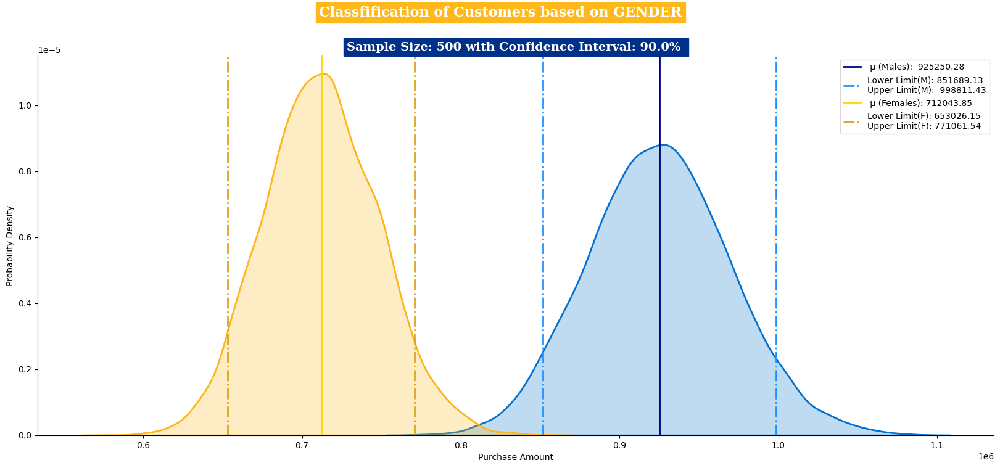

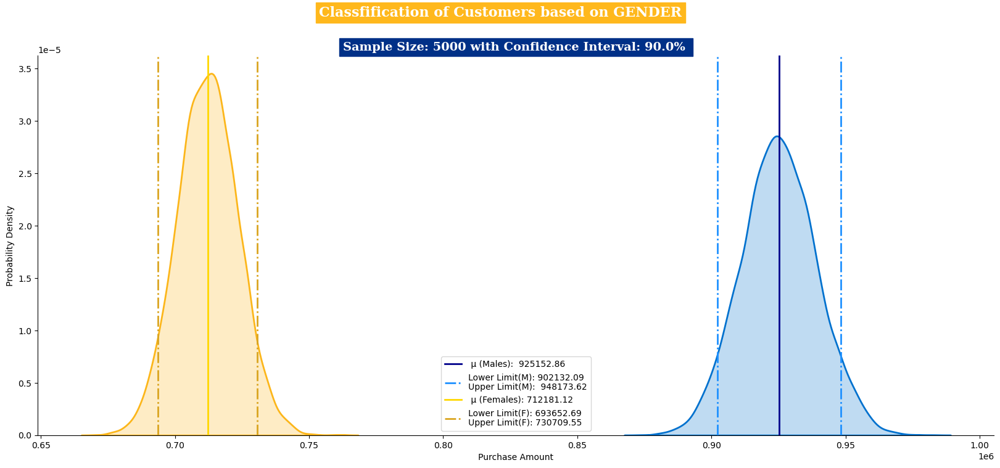

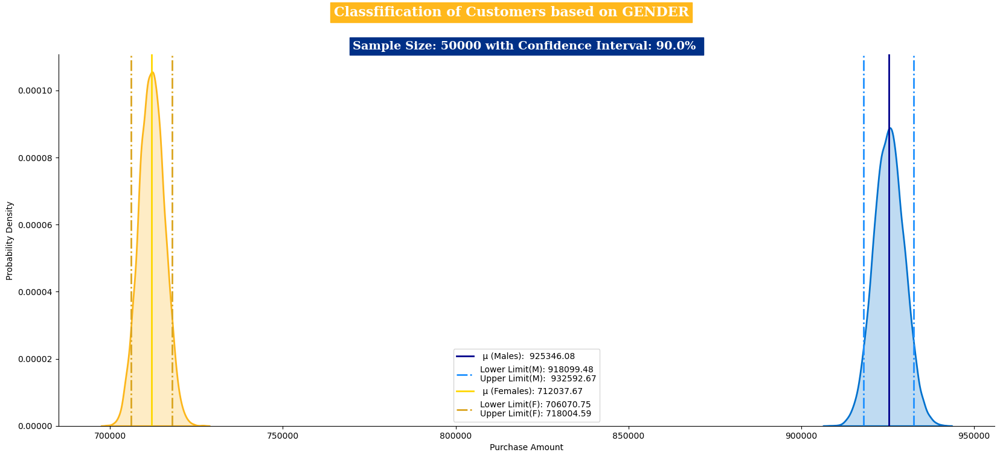

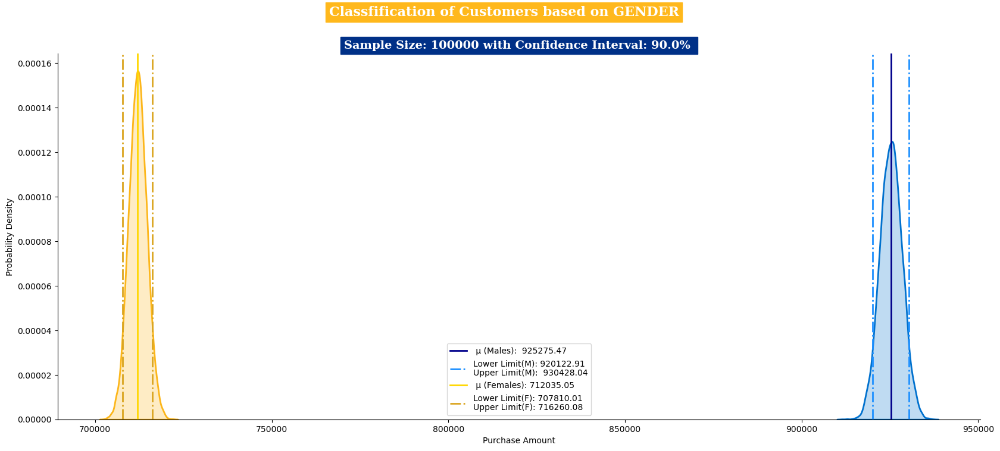

In [377]:
sample_sizes = [50,500,5000,50000,100000]
ci = [90]
ntimes = 10000

df = pd.DataFrame(columns=['Gender','Sample Size','Lower Limit','Upper Limit','Sample Mean','Confidence Interval','Range'])

for j in ci:
    for i in sample_sizes:
        m_avg, f_avg, ll_m, ul_m, ll_f, ul_f = bootstrapping('GENDER',male_purchase, female_purchase, i, ntimes, j)

        df.loc[len(df.index)] = ['M' , i , ll_m , ul_m , m_avg , j , (ul_m - ll_m)]
        df.loc[len(df.index)] = ['F' , i , ll_f , ul_f , f_avg , j , (ul_f - ll_f)]
        
df

#### ✅ **95% CI**

,Gender,Sample Size,Lower Limit,Upper Limit,Sample Mean,Confidence Interval,Range
0,M,50,656354.94,1195091.50,925723.22,95,538736.56
1,F,50,488099.76,936808.35,712454.06,95,448708.59
2,M,500,837955.08,1011954.99,924955.04,95,173999.91
3,F,500,640217.94,784635.77,712426.85,95,144417.83
4,M,5000,898270.66,952677.71,925474.19,95,54407.05
5,F,5000,689688.88,734434.03,712061.46,95,44745.15
6,M,50000,916826.16,934053.91,925440.03,95,17227.75
7,F,50000,705041.53,719106.96,712074.24,95,14065.43
8,M,100000,919067.18,931519.16,925293.17,95,12451.98
9,F,100000,706982.59,716977.91,711980.25,95,9995.32


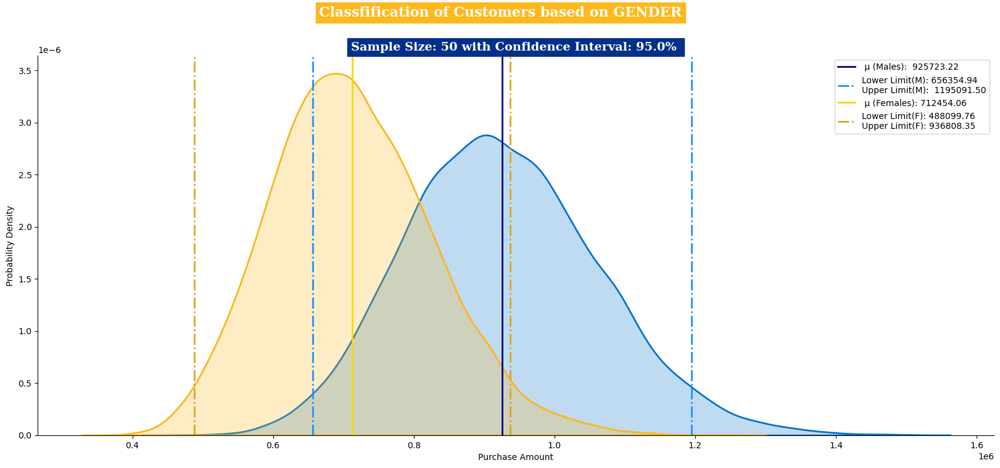

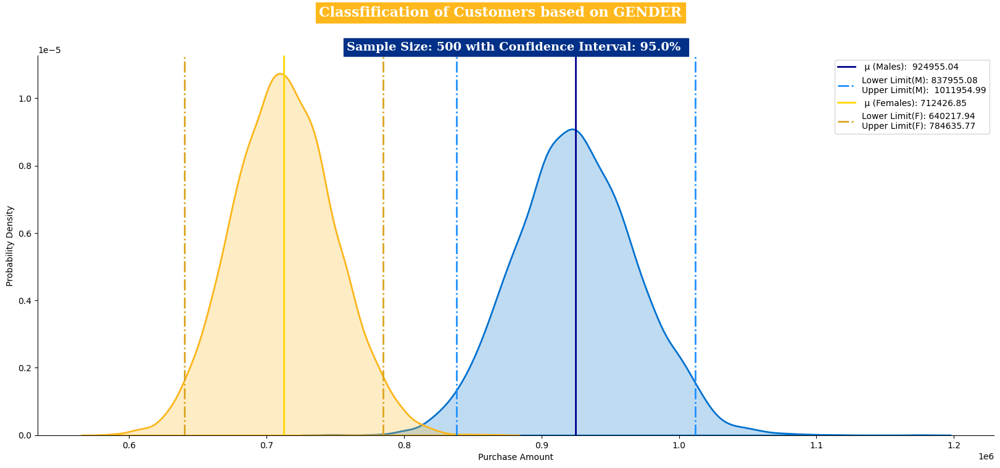

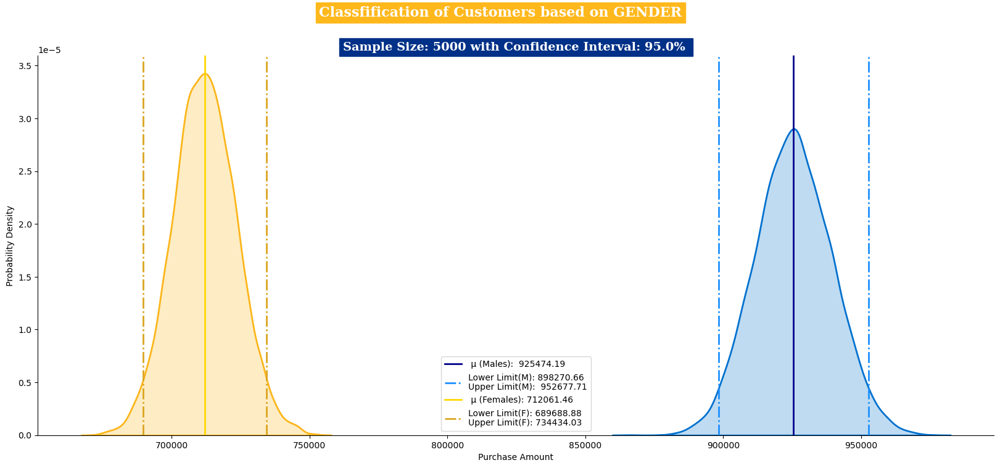

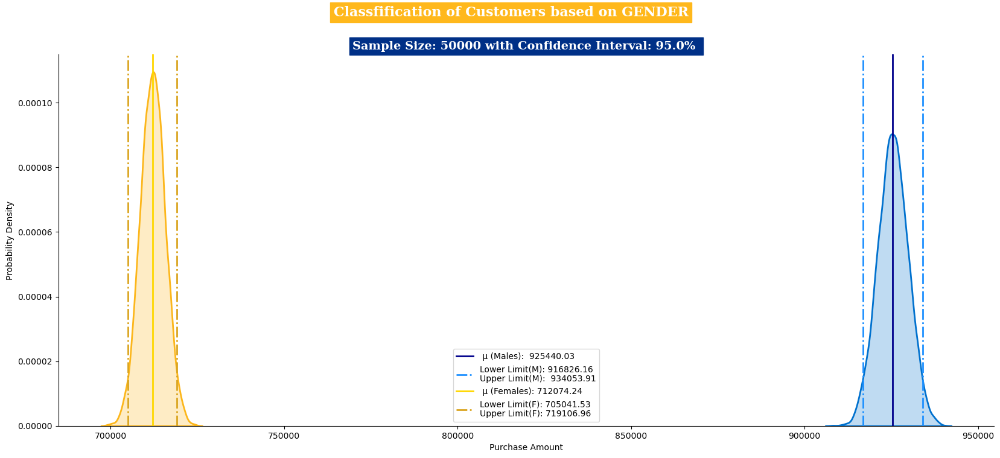

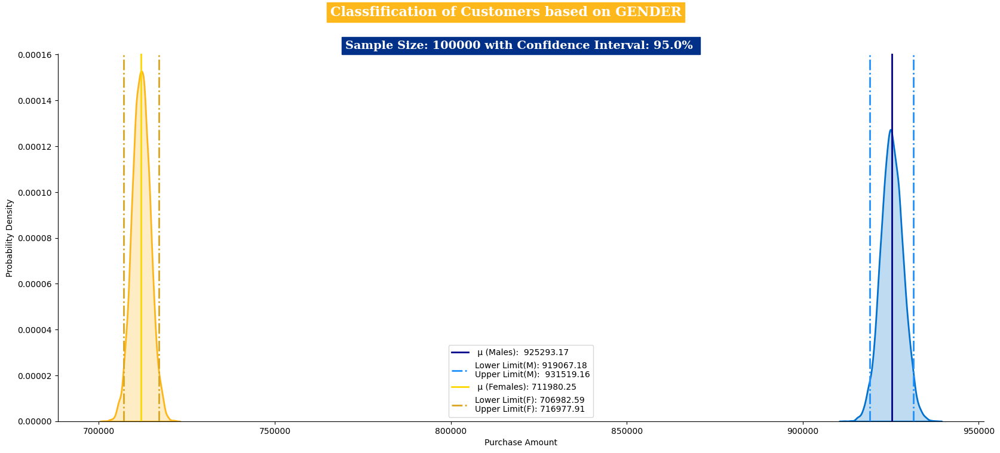

In [378]:
sample_sizes = [50,500,5000,50000,100000]
ci = [95]
ntimes = 10000

df = pd.DataFrame(columns=['Gender','Sample Size','Lower Limit','Upper Limit','Sample Mean','Confidence Interval','Range'])

for j in ci:
    for i in sample_sizes:
        m_avg, f_avg, ll_m, ul_m, ll_f, ul_f = bootstrapping('GENDER',male_purchase, female_purchase, i, ntimes, j)

        df.loc[len(df.index)] = ['M' , i , ll_m , ul_m , m_avg , j , (ul_m - ll_m)]
        df.loc[len(df.index)] = ['F' , i , ll_f , ul_f , f_avg , j , (ul_f - ll_f)]
        
df

#### ✅ **99% CI**

,Gender,Sample Size,Lower Limit,Upper Limit,Sample Mean,Confidence Interval,Range
0,M,50,569293.01,1274365.00,921829.00,99,705071.99
1,F,50,419571.72,1004375.14,711973.43,99,584803.42
2,M,500,811671.65,1038965.93,925318.79,99,227294.28
3,F,500,619579.63,804165.48,711872.56,99,184585.85
4,M,5000,889705.21,961388.39,925546.80,99,71683.18
5,F,5000,683048.64,741000.74,712024.69,99,57952.10
6,M,50000,914027.54,936570.82,925299.18,99,22543.28
7,F,50000,702621.29,721390.65,712005.97,99,18769.36
8,M,100000,917313.07,933423.17,925368.12,99,16110.10
9,F,100000,705327.25,718631.34,711979.30,99,13304.09


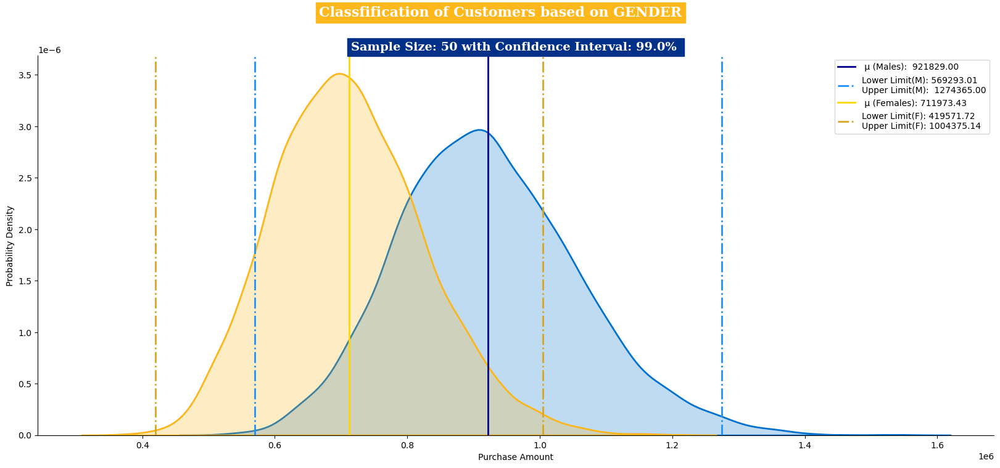

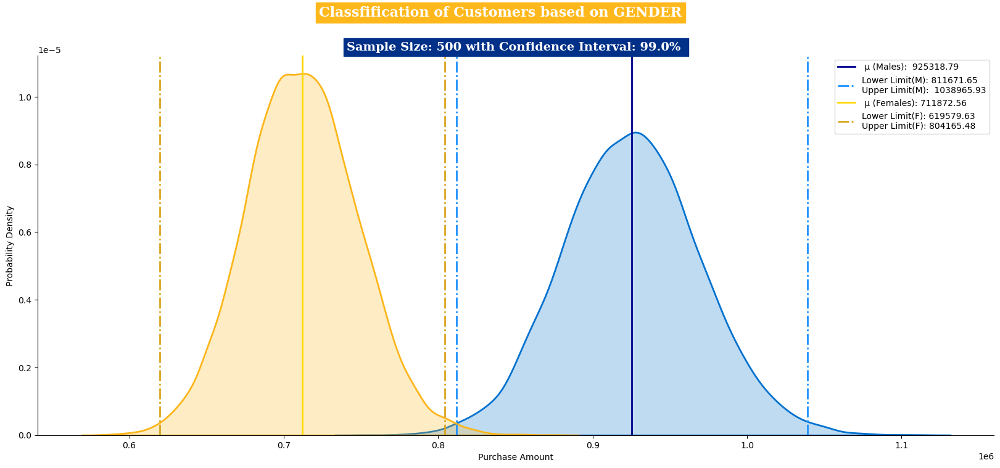

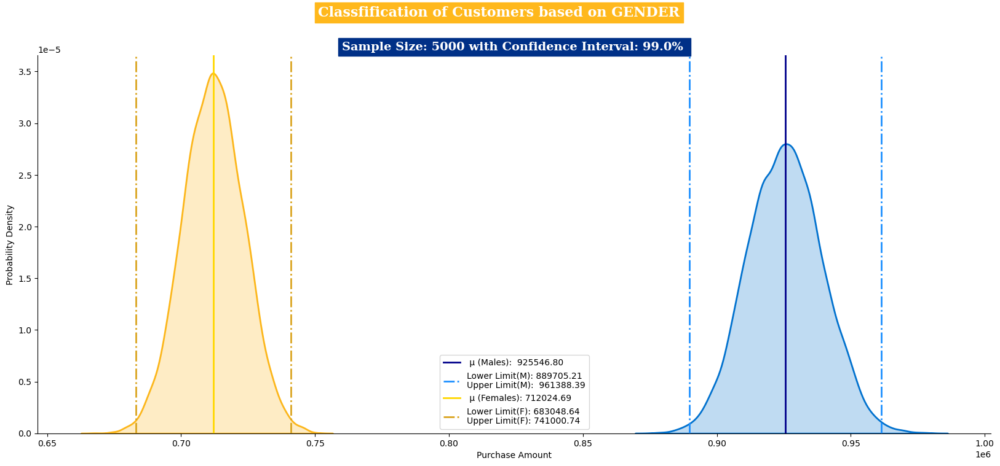

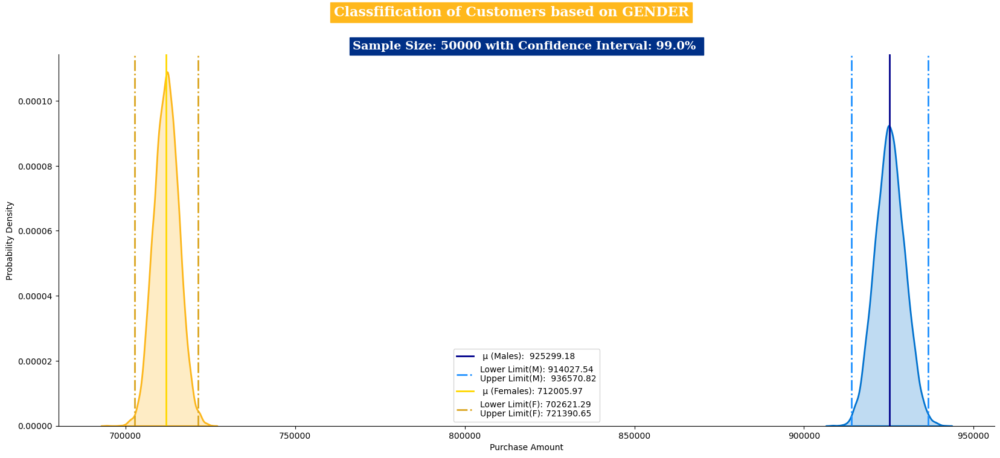

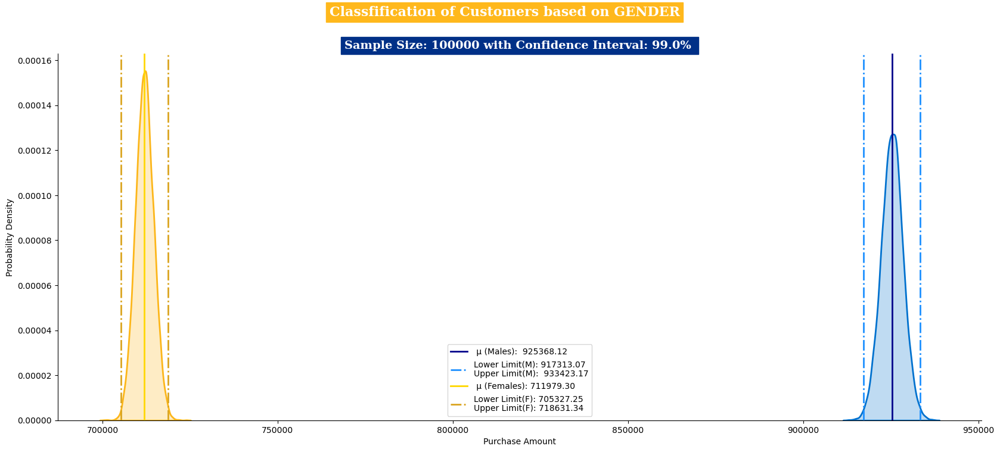

In [379]:
sample_sizes = [50,500,5000,50000,100000]
ci = [99]
ntimes = 10000

df = pd.DataFrame(columns=['Gender','Sample Size','Lower Limit','Upper Limit','Sample Mean','Confidence Interval','Range'])

for j in ci:
    for i in sample_sizes:
        m_avg, f_avg, ll_m, ul_m, ll_f, ul_f = bootstrapping('GENDER',male_purchase, female_purchase, i, ntimes, j)

        df.loc[len(df.index)] = ['M' , i , ll_m , ul_m , m_avg , j , (ul_m - ll_m)]
        df.loc[len(df.index)] = ['F' , i , ll_f , ul_f , f_avg , j , (ul_f - ll_f)]
        
df

#### 🏷️**Insights**

- 🧐***Observation***
    
    - The average for both of them changes significantly as the sample size increases:

        - As the **sample size** `increases`, the average values for both genders undergo noticeable changes.
        
        - **Larger sample sizes** tend to provide *more representative insights* into the population, leading to `more stable` and reliable average values.
        
    - Both plots start to separate and become distinct:

        - With *increasing sample size*, the plots representing the data for males and females start to `diverge` and show distinct patterns.
        
        - This separation could indicate that the **larger sample sizes** are capturing `more nuances` in the data, revealing differences between males and females that might not be as apparent in smaller samples.
        
👉 **For *Sample size 50*, The *confidence interval [90%,95%,99%]* for both ***Male and Female*** is `OVERLAPPING` and as the sample size increases, we can see the interval ranges seperating and then finally they both `DON'T OVERLAP`.**

----


#### ▶️〰️◀️Confidence intervals and distribution of the mean of the expenses based on customers Marital_Status

In [370]:
wm.sample()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
32599,1005003,P00249542,M,36-45,12,C,1,Single,1,15696


In [412]:
wm.groupby(['Marital_Status'])['Purchase'].describe().T

Marital_Status,Single,Married
count,324731.000000,225337.000000
mean,9265.907619,9261.174574
std,5027.347859,5016.897378
min,12.000000,12.000000
25%,5605.000000,5843.000000
50%,8044.000000,8051.000000
75%,12061.000000,12042.000000
max,23961.000000,23961.000000


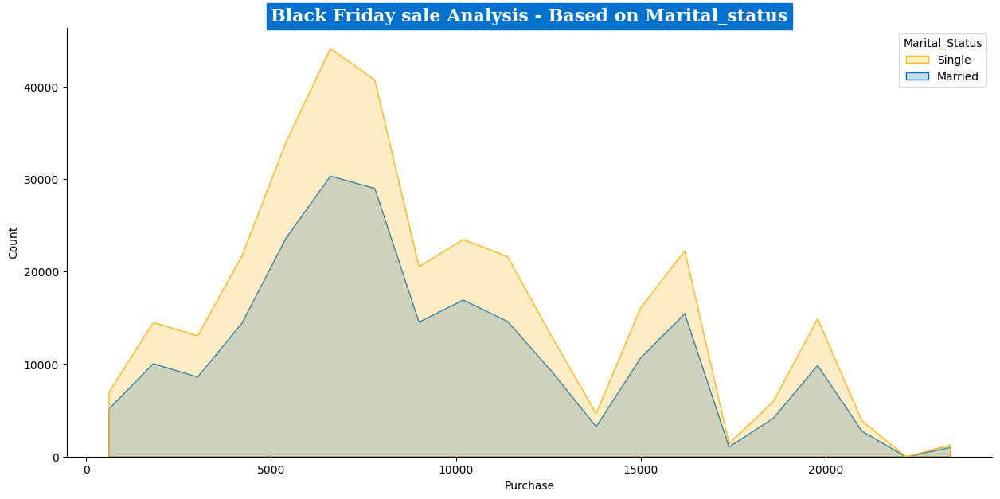

In [394]:
plt.figure(figsize=(15,7))
sns.histplot(data=wm, x = "Purchase", bins=20, hue = "Marital_Status",element='poly',palette=cp2[::-1])
sns.despine()
plt.title('Black Friday sale Analysis - Based on Marital_status',fontfamily='serif',fontweight='bold',
          fontsize=16,backgroundcolor=cp2[0],color='w')
plt.show()

In [388]:
wm_married_cust = wm[wm['Marital_Status'] == 'Married']['Purchase']
wm_single_cust = wm[wm['Marital_Status'] == 'Single']['Purchase']

In [531]:
sample_male = wm_married_cust.sample(500)
z_score_90 = norm.ppf(0.9).round(2)
z_score_95 = norm.ppf(0.95).round(2)
z_score_99 = norm.ppf(0.99).round(2)
print(f"Married purchase amount - Confidence interval :")
male_pop_mean = np.mean(sample_male).round(2)
print(f"Population purchase mean for Married Customers : {male_pop_mean}")
pop_std_dev = np.round(np.std(sample_male),2)
print(f"Population purchase standard deviation for Married Customers : {pop_std_dev}")
print()
se = pop_std_dev/np.sqrt(500)
x1 =  (male_pop_mean - (z_score_90 * se)).round(2)
x2 =  (male_pop_mean + (z_score_90 * se)).round(2)
print(f"The 90% confidence interval --> $ {x1} to $ {x2}")
x1 =  (male_pop_mean - (z_score_95 * se)).round(2)
x2 =  (male_pop_mean + (z_score_95 * se)).round(2)
print(f"The 95% confidence interval --> $ {x1} to $ {x2}")
x1 =  (male_pop_mean - (z_score_99 * se)).round(2)
x2 =  (male_pop_mean + (z_score_99 * se)).round(2)
print(f"The 99% confidence interval --> $ {x1} to $ {x2}")

Married purchase amount - Confidence interval :
Population purchase mean for Married Customers : 9450.15
Population purchase standard deviation for Married Customers : 5288.46

The 90% confidence interval --> $ 9147.42 to $ 9752.88
The 95% confidence interval --> $ 9062.28 to $ 9838.02
The 99% confidence interval --> $ 8899.09 to $ 10001.21


In [532]:
sample_male = wm_single_cust.sample(500)
z_score_90 = norm.ppf(0.9).round(2)
z_score_95 = norm.ppf(0.95).round(2)
z_score_99 = norm.ppf(0.99).round(2)
print(f"UnMarried purchase amount - Confidence interval :")
male_pop_mean = np.mean(sample_male).round(2)
print(f"Population purchase mean for single Customers : {male_pop_mean}")
pop_std_dev = np.round(np.std(sample_male),2)
print(f"Population purchase standard deviation for single Customers : {pop_std_dev}")
print()
se = pop_std_dev/np.sqrt(500)
x1 =  (male_pop_mean - (z_score_90 * se)).round(2)
x2 =  (male_pop_mean + (z_score_90 * se)).round(2)
print(f"The 90% confidence interval --> $ {x1} to $ {x2}")
x1 =  (male_pop_mean - (z_score_95 * se)).round(2)
x2 =  (male_pop_mean + (z_score_95 * se)).round(2)
print(f"The 95% confidence interval --> $ {x1} to $ {x2}")
x1 =  (male_pop_mean - (z_score_99 * se)).round(2)
x2 =  (male_pop_mean + (z_score_99 * se)).round(2)
print(f"The 99% confidence interval --> $ {x1} to $ {x2}")

UnMarried purchase amount - Confidence interval :
Population purchase mean for single Customers : 9314.22
Population purchase standard deviation for single Customers : 5118.2

The 90% confidence interval --> $ 9021.24 to $ 9607.2
The 95% confidence interval --> $ 8938.84 to $ 9689.6
The 99% confidence interval --> $ 8780.9 to $ 9847.54


### **SINGLE  & MARRIED**

#### ✅ **90% CI**

,Gender,Sample Size,Lower Limit,Upper Limit,Sample Mean,Confidence Interval,Range
0,M,50,8112.22,10426.81,9269.52,90,2314.59
1,F,50,8086.26,10441.58,9263.92,90,2355.32
2,M,500,8897.27,9630.62,9263.95,90,733.35
3,F,500,8897.91,9642.00,9269.95,90,744.09
4,M,5000,9144.82,9379.93,9262.37,90,235.11
5,F,5000,9147.95,9384.60,9266.28,90,236.65
6,M,50000,9224.20,9297.72,9260.96,90,73.52
7,F,50000,9229.23,9303.24,9266.23,90,74.01
8,M,100000,9234.77,9287.12,9260.94,90,52.35
9,F,100000,9239.77,9292.17,9265.97,90,52.40


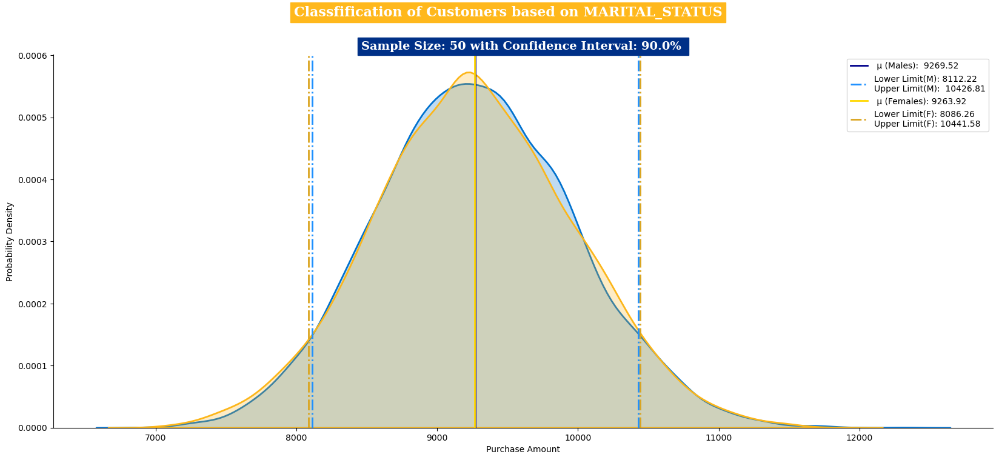

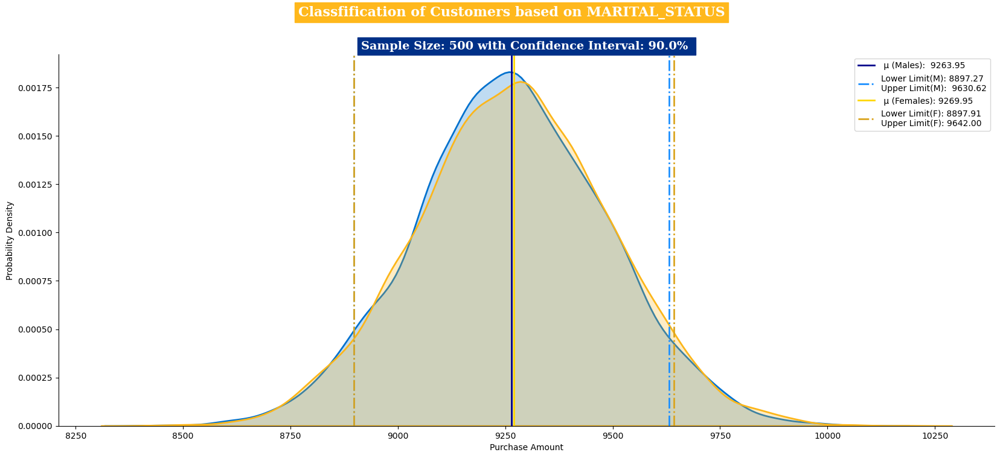

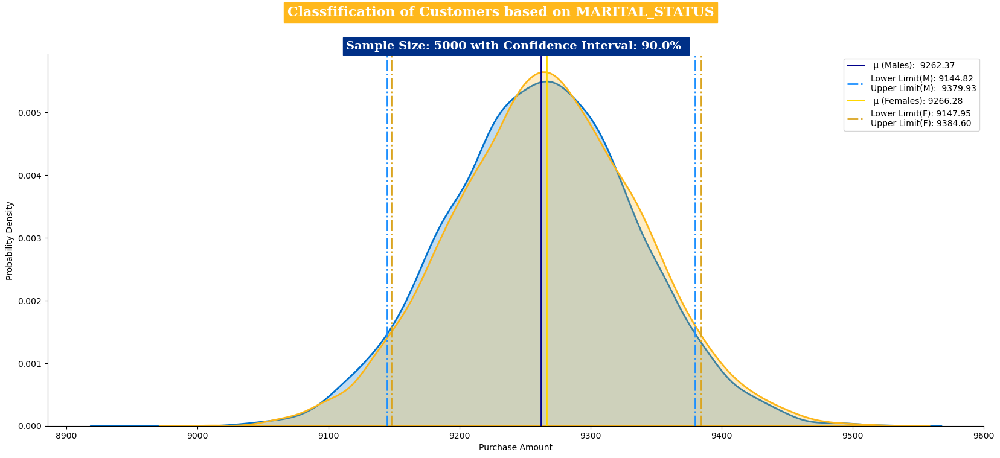

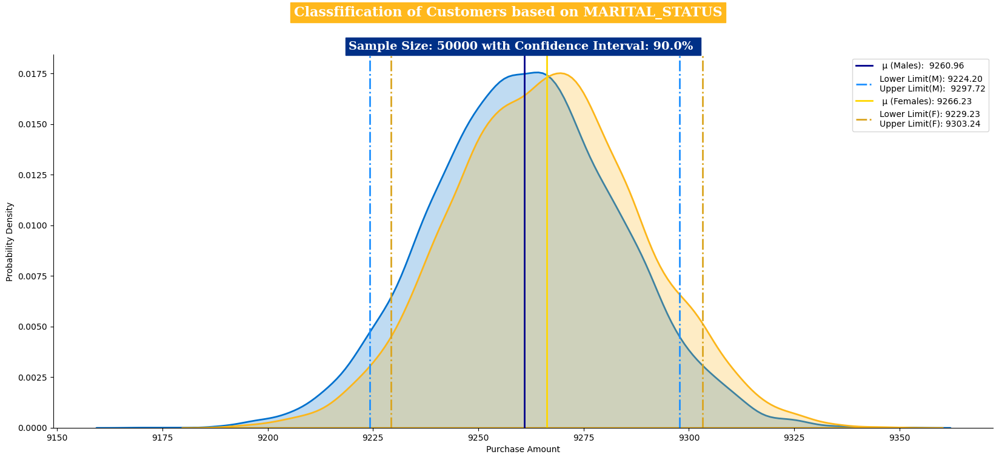

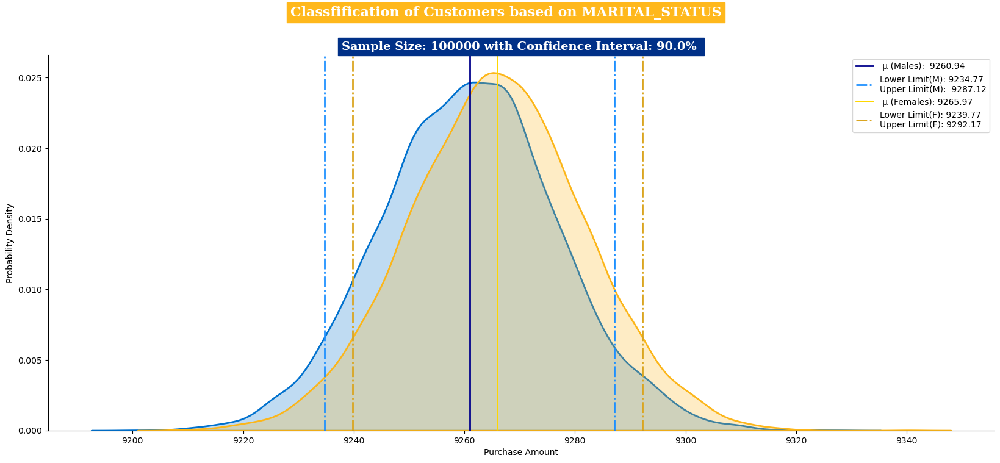

In [389]:
sample_sizes = [50,500,5000,50000,100000]
ci = [90]
ntimes = 10000

df = pd.DataFrame(columns=['Gender','Sample Size','Lower Limit','Upper Limit','Sample Mean','Confidence Interval','Range'])

for j in ci:
    for i in sample_sizes:
        m_avg, s_avg, ll_m, ul_m, ll_s, ul_s = bootstrapping('MARITAL_STATUS',wm_married_cust, wm_single_cust, i, ntimes, j)

        df.loc[len(df.index)] = ['M' , i , ll_m , ul_m , m_avg , j , (ul_m - ll_m)]
        df.loc[len(df.index)] = ['F' , i , ll_s , ul_s , s_avg , j , (ul_s - ll_s)]
        
df

#### ✅ **95% CI**

,Gender,Sample Size,Lower Limit,Upper Limit,Sample Mean,Confidence Interval,Range
0,M,50,7877.33,10665.86,9271.59,95,2788.53
1,F,50,7865.50,10646.18,9255.84,95,2780.68
2,M,500,8816.65,9703.87,9260.26,95,887.22
3,F,500,8821.39,9709.93,9265.66,95,888.54
4,M,5000,9119.63,9401.27,9260.45,95,281.64
5,F,5000,9126.55,9403.68,9265.12,95,277.13
6,M,50000,9217.10,9305.22,9261.16,95,88.12
7,F,50000,9221.97,9310.76,9266.37,95,88.79
8,M,100000,9229.87,9292.16,9261.01,95,62.29
9,F,100000,9234.59,9296.83,9265.71,95,62.24


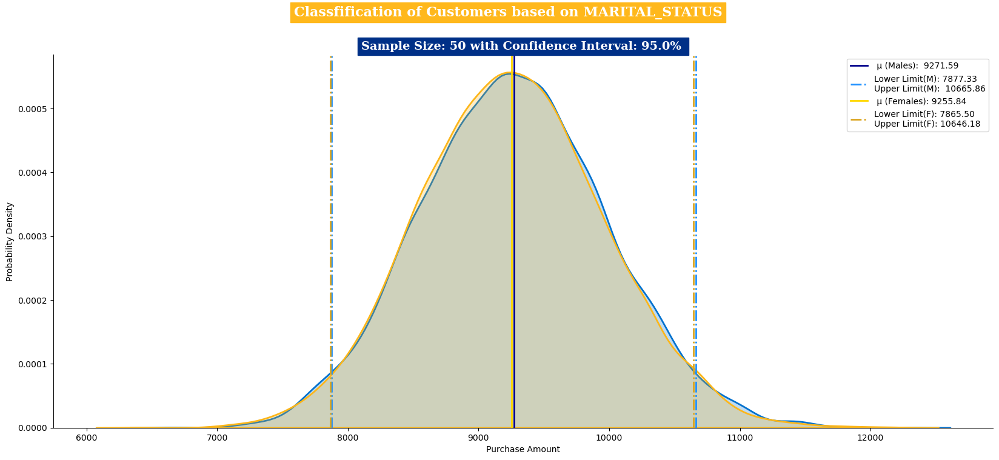

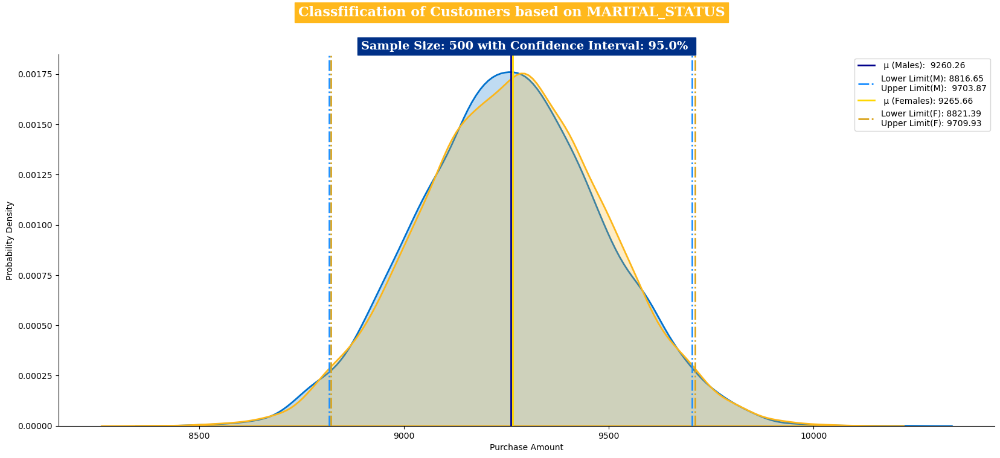

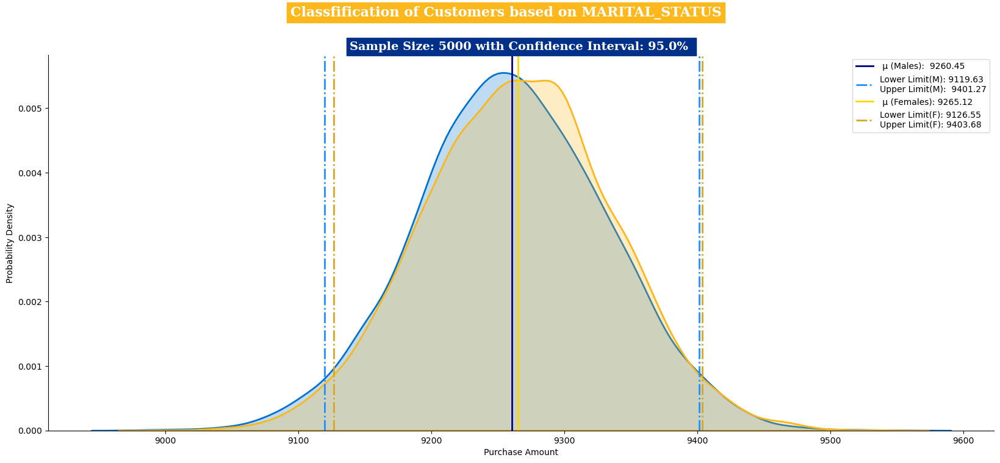

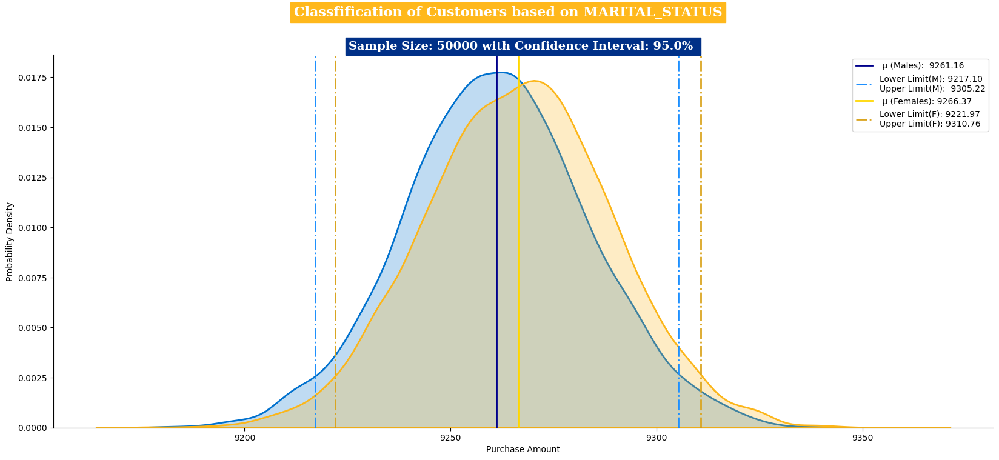

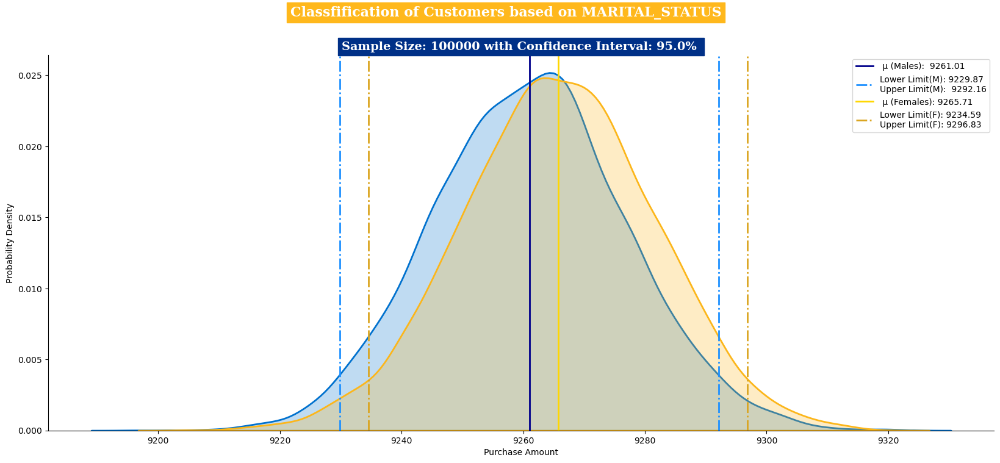

In [390]:
sample_sizes = [50,500,5000,50000,100000]
ci = [95]
ntimes = 10000

df = pd.DataFrame(columns=['Gender','Sample Size','Lower Limit','Upper Limit','Sample Mean','Confidence Interval','Range'])

for j in ci:
    for i in sample_sizes:
        m_avg, s_avg, ll_m, ul_m, ll_s, ul_s = bootstrapping('MARITAL_STATUS',wm_married_cust, wm_single_cust, i, ntimes, j)

        df.loc[len(df.index)] = ['M' , i , ll_m , ul_m , m_avg , j , (ul_m - ll_m)]
        df.loc[len(df.index)] = ['F' , i , ll_s , ul_s , s_avg , j , (ul_s - ll_s)]
        
df

#### ✅ **99% CI**

,Gender,Sample Size,Lower Limit,Upper Limit,Sample Mean,Confidence Interval,Range
0,M,50,7421.05,11102.55,9261.80,99,3681.50
1,F,50,7457.55,11072.42,9264.98,99,3614.87
2,M,500,8677.13,9841.92,9259.52,99,1164.79
3,F,500,8689.67,9844.03,9266.85,99,1154.36
4,M,5000,9077.72,9443.59,9260.65,99,365.87
5,F,5000,9081.90,9448.93,9265.41,99,367.03
6,M,50000,9203.54,9318.97,9261.25,99,115.43
7,F,50000,9207.79,9324.82,9266.30,99,117.03
8,M,100000,9220.07,9301.84,9260.95,99,81.77
9,F,100000,9225.05,9306.58,9265.81,99,81.53


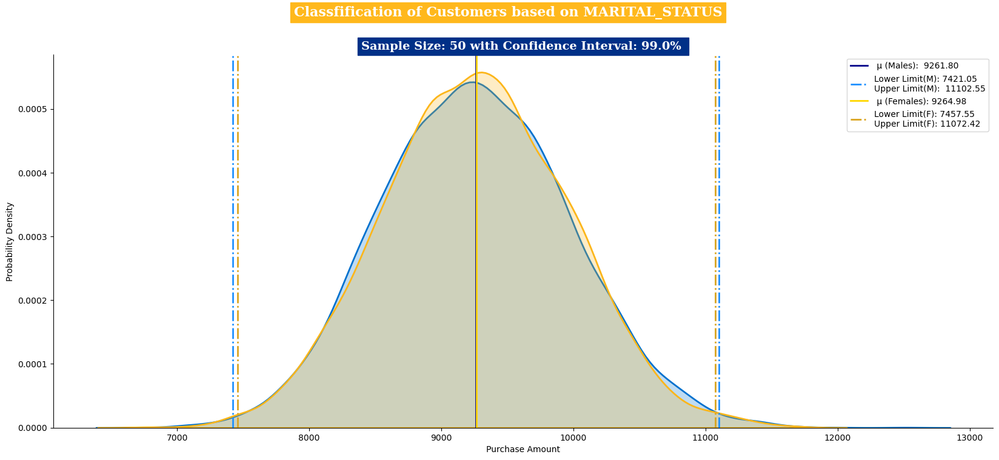

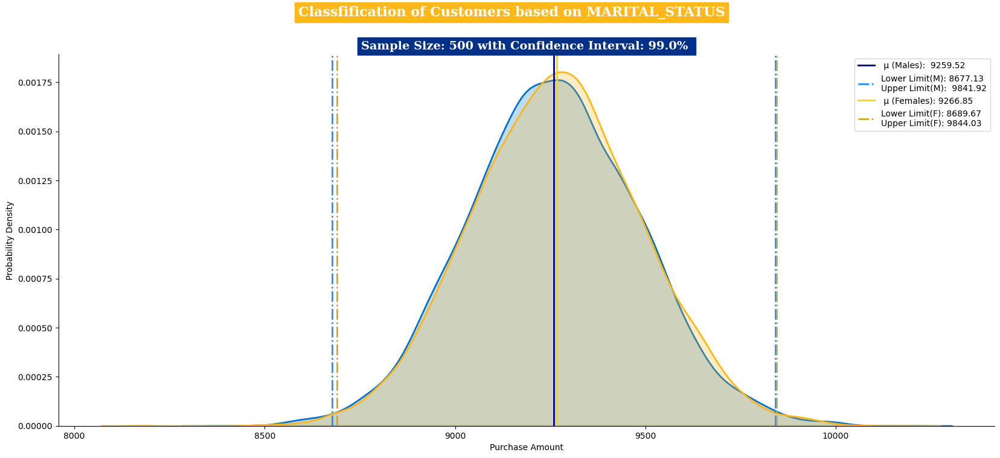

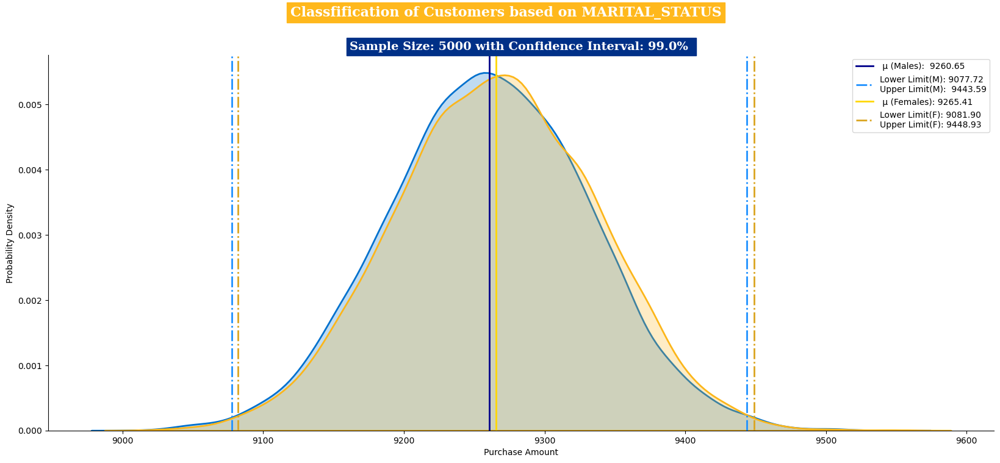

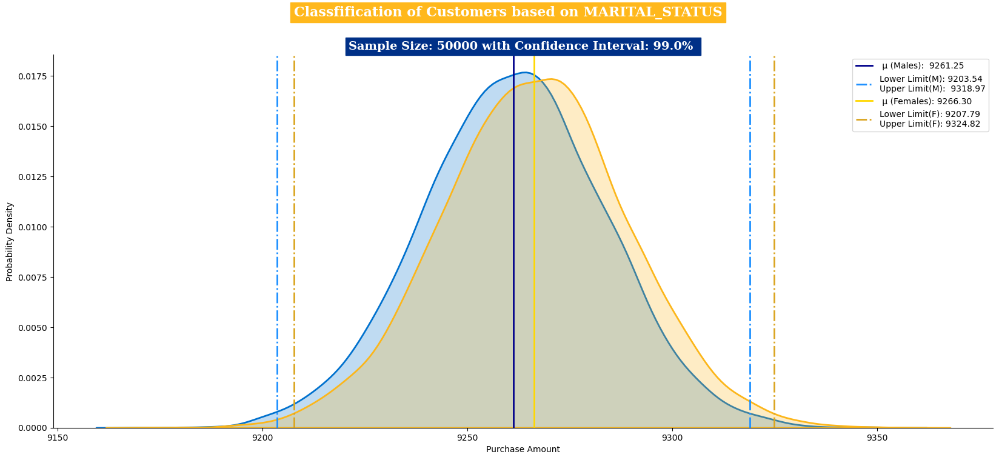

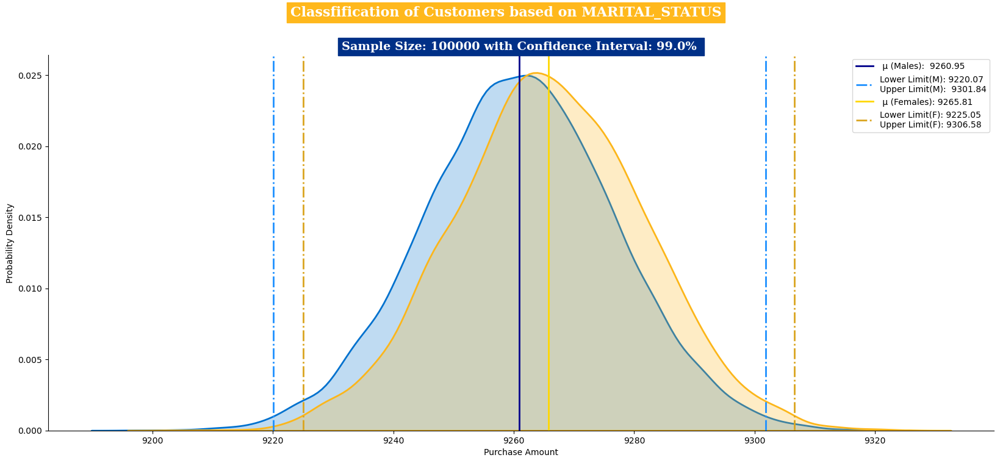

In [391]:
sample_sizes = [50,500,5000,50000,100000]
ci = [99]
ntimes = 10000

df = pd.DataFrame(columns=['Gender','Sample Size','Lower Limit','Upper Limit','Sample Mean','Confidence Interval','Range'])

for j in ci:
    for i in sample_sizes:
        m_avg, s_avg, ll_m, ul_m, ll_s, ul_s = bootstrapping('MARITAL_STATUS',wm_married_cust, wm_single_cust, i, ntimes, j)

        df.loc[len(df.index)] = ['M' , i , ll_m , ul_m , m_avg , j , (ul_m - ll_m)]
        df.loc[len(df.index)] = ['F' , i , ll_s , ul_s , s_avg , j , (ul_s - ll_s)]
        
df

#### 🏷️**Insights**

- 🧐***Observation***
    
    - The average for both of them changes significantly as the sample size increases:

        - As the **sample size** `increases`, the average values based on `Marital_status` undergo mineute changes.
        
        - **Larger sample sizes** tend to provide *more representative insights* into the population, leading to `more stable` and reliable average values.
        
    - Both plots start to separate slightly and still overlapping:

        - With *increasing sample size*, the plots representing the data for single and married customers start to `diverge a little` and show approx similar patterns.
        
        - This mineute separation could indicate that the **larger sample sizes** are capturing `more nuances` in the data, revealing no or mineute differences between married and single customers that might be as apparent in smaller samples.
        
👉 **For *Any Sample size*, The *confidence interval [90%,95%,99%]* for both ***Married and Single*** is `OVERLAPPING` and as the sample size increases, we can see the interval ranges slightly seperating and still they both `OVERLAP`.**

----


## 📣✴️CONCLUSION & RECOMMENDATION :

### Recommendations with Actionable Insights

- **Target Male Shoppers:**
   
   - Launch targeted marketing campaigns showcasing products preferred by men. Offer exclusive deals on male-oriented items.    

- **Age-Group Focus:**
  
  - Analyze popular products within the 26 - 45 age group. Introduce promotions highlighting these products to enhance engagement.    


- **Engage Younger Shoppers:**
   
   - Create a loyalty program for the 0 - 17 age group with rewards for frequent purchases. Implement visually appealing online promotions.  
  

- **Customer Segmentation:**
   
   - Conduct a detailed analysis of buying behaviors within specific age brackets. Tailor promotions and product placements accordingly.    


- **Enhance Shopping Experience (51 - 55):**
   
  - Implement a personalized shopping experience for customers aged 51 - 55, including early access to sales and exclusive discounts.    

  
- **Post-Black Friday Engagement:**
    
    -  Develop an automated follow-up email system with personalized recommendations based on customers' Black Friday purchases.    
  

- **Differentiated Marketing for Genders:**
  
    - Launch gender-specific marketing campaigns, emphasizing affordability for men and premium offerings for women.    

  
- **Accessibility for All Age Groups:**
   
   - Partner with local transport services to provide convenient transportation options. Promote online shopping accessibility for those facing mobility challenges.   
  
- **Analyze High-Spending Individuals:**
   
   - Conduct surveys or interviews with high-spending individuals to understand preferences. Use insights to refine product offerings and marketing strategies.     

  
- **Collaboration with Local Transport:**
    
    - Initiate discussions with local transport providers for potential collaborations. Offer discounts or incentives for customers using designated transport services.     

  
- **Evaluate Price Sensitivity:**
    
    - Implement dynamic pricing strategies based on real-time data analysis. Test price elasticity within different demographic segments.   


- **Continuous Data Analysis:**
    
    - Establish a dedicated data analytics team to continuously monitor and analyze customer data. Implement an agile approach to adapt strategies based on emerging trends.    

### 🧺**Leveraging Conclusions for WALMART**🧺:

- ❇️**Targeted Marketing**

    🔹Boost spending for 0 - 17 age group with attractive incentives and tailored marketing.  
    
- ❇️**Customer Segmentation**

    🔹Optimize product selection and pricing for age groups with similar buying behaviors.  
    
- ❇️**Premium Services**

    🔹Enhance the shopping experience for high-spending 51 - 55 age group with premium services and tailored loyalty programs.  
    

- ❇️**Identifying Differences:**

    🔹`Walmart` can capitalize on the recognized distinctions between male and female customer behaviors.
    
    🔹**Tailoring marketing strategies, product offerings, and promotions** based on these differences can enhance customer engagement.
    
    🔹By understanding gender-specific preferences, Walmart can create **more targeted and appealing campaigns** for each demographic.

- ❇️**Decision-Making:**

    🔹Decision-makers at Walmart now have valuable insights to inform their strategic decisions.
    
    🔹Understanding how gender influences customer choices enables more precise decision-making in areas such as product assortment, pricing strategies, and promotional activities.
    
    🔹Informed decision-making ensures that resources are allocated effectively, maximizing the impact of business initiatives.

- ❇️**Operational Adjustments:**

    🔹Operational aspects, such as **inventory management** and **store layout**, can benefit from insights into gender-related patterns.
    
    🔹`Walmart` may consider optimizing inventory based on observed preferences, ensuring that popular products are *well-stocked*.
    
    🔹Store layouts can be adjusted to enhance the **shopping experience** for both genders, creating a more personalized and enjoyable atmosphere.


#### ***In summary, leveraging these conclusions empowers `WALMART` to tailor its approach to different customer segments, make informed decisions grounded in observed behaviors, and optimize operational aspects for a more customer-centric and efficient retail experience. ***`WALMART`*** can strategically implement changes to drive customer engagement, increase sales, and enhance the overall shopping experience.***

----